<a href="https://colab.research.google.com/github/Shaddy-joker/Text_Analytics_Hate_Speech_Detection/blob/main/Text_Analytics_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import re
import string
import pickle
import pandas as pd
import numpy as np
import nltk
import joblib
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
from collections import Counter
from matplotlib import style
style.use('ggplot')
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
import string
# from tensorflow import keras
# from tensorflow.keras import layers
# from tensorflow.keras import losses
# from tensorflow.keras import regularizers
# from tensorflow.keras import preprocessing
# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from keras.utils import to_categorical
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
# # from tensorflow.keras.models import Bidirectional
# from tensorflow.keras.layers import Dense

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
student_id = 2202326 # Note this is an interger and you need to input your id

In [ ]:
# set same seeds for all libraries

#numpy seed
np.random.seed(student_id)

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


## Function to check if the directory exists in the filesystem, IF not then create those directories to avoid errors

In [ ]:
def chk_directory(filePath):  # defining a function chk_direcory which takes filePath as parameters
  directory = filePath   # assigning the value of file Path to directory

  if not os.path.exists(directory):  # check if the specified directory does not exists in directory
      os.makedirs(directory)  # create a new directory with the specified name
      print(f"Directory '{directory}' created.")  # print that the directory is successfully created
  else:
      print(f"Directory '{directory}' already exists.")  # else print that directory already exists

## Declaring all the required variables for file path to access the files stored on google drive

In [ ]:
# Add your code to initialize GDrive and data and models paths

# TODO: Fill in the Google Drive path where you uploaded the assignment, data and code
# Example: If your student_id is 1234567 then your directory will be './CE807/Assignment2/1234567/'

GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = os.path.join('CE807/Assignment2/',str(student_id)) # Make sure to update with your student_id and student_id is an integer
GOOGLE_DRIVE_PATH = os.path.join('gdrive', 'MyDrive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)

chk_directory(GOOGLE_DRIVE_PATH)   # check if the specified path exists in the directory

print('List files: ', os.listdir(GOOGLE_DRIVE_PATH)) # listing all the directories in the folder

train_file = os.path.join(GOOGLE_DRIVE_PATH, 'train.csv') # path for train file
print('Train file: ', train_file)

valid_file = os.path.join(GOOGLE_DRIVE_PATH, 'valid.csv') # path for validation file
print('Validation file: ', valid_file)

test_file = os.path.join(GOOGLE_DRIVE_PATH, 'test.csv') # path for test file
print('Testing file: ', test_file)

train_75_file = os.path.join(GOOGLE_DRIVE_PATH, 'train_75.csv') # path for 25% of the train data

train_50_file = os.path.join(GOOGLE_DRIVE_PATH, 'train_50.csv') # path for 50% of the train data

train_25_file = os.path.join(GOOGLE_DRIVE_PATH, 'train_25.csv') # path for 75% of the train data



MODEL_1_DIRECTORY = os.path.join(GOOGLE_DRIVE_PATH, 'models', '1') # Model 1 directory
chk_directory(MODEL_1_DIRECTORY)   # check if the specified path exists in the directory
print('Model 1 directory: ', MODEL_1_DIRECTORY)

MODEL_1_25_DIRECTORY = os.path.join(MODEL_1_DIRECTORY,'25') # Model 1 trained using 25% of train data directory
chk_directory(MODEL_1_25_DIRECTORY)   # check if the specified path exists in the directory

print('Model 1 directory with 25% data: ', MODEL_1_25_DIRECTORY)

vectorizer_25_file = os.path.join(MODEL_1_25_DIRECTORY,'vectorizer.sav') # file path to access 25% of the vectorizer file

model_1_25_output_test_file = os.path.join(MODEL_1_25_DIRECTORY, 'output_test.csv') # Output file using Model 1 trained using 25% of train data
print('Output file name using model 1 using 25% of train data: ',model_1_25_output_test_file)



MODEL_1_50_DIRECTORY = os.path.join(MODEL_1_DIRECTORY,'50') # Model 1 trained using 50% of train data directory
chk_directory(MODEL_1_50_DIRECTORY)   # check if the specified path exists in the directory
print('Model 1 directory with 50% data: ', MODEL_1_50_DIRECTORY)

vectorizer_50_file = os.path.join(MODEL_1_50_DIRECTORY,'vectorizer.sav') # file path to access 50% of the vectorizer file

model_1_50_output_test_file = os.path.join(MODEL_1_50_DIRECTORY, 'output_test.csv') # Output file using Model 1 trained using 50% of train data
print('Output file name using model 1 using 50% of train data: ',model_1_50_output_test_file)



MODEL_1_75_DIRECTORY = os.path.join(MODEL_1_DIRECTORY,'75') # Model 1 trained using 75% of train data directory
chk_directory(MODEL_1_75_DIRECTORY)   # check if the specified path exists in the directory
print('Model 1 directory with 75% data: ', MODEL_1_75_DIRECTORY)

vectorizer_75_file = os.path.join(MODEL_1_75_DIRECTORY,'vectorizer.sav') # file path to access 75% of the vectorizer file

model_1_75_output_test_file = os.path.join(MODEL_1_75_DIRECTORY, 'output_test.csv') # Output file using Model 1 trained using 75% of train data
print('Output file name using model 1 using 75% of train data: ',model_1_75_output_test_file)


MODEL_1_100_DIRECTORY = os.path.join(MODEL_1_DIRECTORY,'100') # Model 1 trained using 100% of train data directory
chk_directory(MODEL_1_100_DIRECTORY)   # check if the specified path exists in the directory
print('Model 1 directory with 100% data: ', MODEL_1_100_DIRECTORY)

vectorizer_100_file = os.path.join(MODEL_1_100_DIRECTORY,'vectorizer.sav') # file path to access 100% of the vectorizer file

model_1_100_output_test_file = os.path.join(MODEL_1_100_DIRECTORY, 'output_test.csv') # Output file using Model 1 trained using 100% of train data
print('Output file name using model 1 using 100% of train data: ',model_1_100_output_test_file)

model_1 = 'Linear Regression'

Directory 'gdrive/MyDrive/CE807/Assignment2/2202326' already exists.
List files:  ['test.csv', 'valid.csv', 'train.csv', 'models', 'train_25.csv', 'train_75.csv', 'train_50.csv']
Train file:  gdrive/MyDrive/CE807/Assignment2/2202326/train.csv
Validation file:  gdrive/MyDrive/CE807/Assignment2/2202326/valid.csv
Testing file:  gdrive/MyDrive/CE807/Assignment2/2202326/test.csv
Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/1' already exists.
Model 1 directory:  gdrive/MyDrive/CE807/Assignment2/2202326/models/1
Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25' already exists.
Model 1 directory with 25% data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25
Output file name using model 1 using 25% of train data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25/output_test.csv
Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50' already exists.
Model 1 directory with 50% data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50
Output file n

Reading the data files

In [ ]:
#function to reading the train data
def read_data(file_name,file):
  orignal_data = pd.read_csv(file_name)  # reading the data from the csv file
  df=orignal_data.copy() # creating a copy of the orignal data to apply the required data processing steps
  print('-----------------------Displaying values from '+file)
  print(df.head())
  # df.head()
  return df

### code to split the train dataset in intervals of 25% each and save the split file on drive

In [ ]:
# Splitting the data into 4 parts
print('Splitting the dataset into 4 parts and saving the file on to drive')
dataset = read_data(train_file,'Training')

print('Printing the Length of the dataset',len(dataset))
# Split the data into the first 25% and the rest
train25, remaining = train_test_split(dataset, test_size=0.75, stratify=dataset['label'])
# saving the 25% file to drive
train25.to_csv(os.path.join(GOOGLE_DRIVE_PATH,'train_25.csv'),index=False)

#spliting data into 25% and the remaining data
train50, rest = train_test_split(remaining,test_size=0.5,stratify=remaining['label'])

# we need to concat the first 25% and the rest of the 25%
modified_50 = pd.concat([train25,train50])
# saving the 50% of the data
modified_50.to_csv(os.path.join(GOOGLE_DRIVE_PATH,'train_50.csv'),index=False)

# we need to concat the first 25% and the rest of the 25%
train75, final = train_test_split(rest,test_size=0.25,stratify=rest['label'])
# we need to concat the first 50% and the rest of the 25%
modified_75 = pd.concat([modified_50,train75])
# saving the 75% of the data
modified_75.to_csv(os.path.join(GOOGLE_DRIVE_PATH,'train_75.csv'),index=False)


Splitting the dataset into 4 parts and saving the file on to drive
-----------------------Displaying values from Training
      id                                              tweet label
0  42884  @USER I’m done with you as well. An INTENTIONA...   NOT
1  92152  I now have over 6k followers.  Only 94k to go ...   NOT
2  65475  @USER Tom was bought! He is more interested in...   NOT
3  22144  @USER @USER Even her brother thinks she is a m...   OFF
4  81048  @USER @USER @USER @USER @USER I can understand...   OFF
Printing the Length of the dataset 12313


## Data cleaning and Data pre processing

In [ ]:
# Function to clean the data

def clean_text(text):
    text = text.lower()  # converting the text to lower case
    text = re.sub(r"https\S+|www\S+http\S+", '', text, flags = re.MULTILINE) # using regex to discard all the web notations
    text = re.sub(r'\@w+|\#','', text) # using regex to discard special characters
    text = re.sub(r'[^\w\s]','',text) # using regex to discard blank spaces and new line
    text_tokens = word_tokenize(text)
    filtered_text = [w for w in text_tokens if not w in stop_words] # using word tokenizer to remove stop words

    return " ".join(filtered_text)


In [ ]:
# Using lemmatization

lemmatizer = WordNetLemmatizer()
def lemmatizing(data):
    tweet = [lemmatizer.lemmatize(word) for word in data] # applying word net lemmatizer on the data
    return data


In [ ]:
#   vectorizing tweets  ###################################### check and discard ###########################################################
# def vectorizing_tweets(text):
#   X = text['tweet']
#   vect = TfidfVectorizer(ngram_range=(1,3))
#   data = vect.fit_transform(X)
#   feature_names = vect.get_feature_names_out()
#   print("--------------------------------------------------Number of features: {}\n".format(len(feature_names)))
#   print("--------------------------------------------------First 20 features: \n{}".format(feature_names[:20]))
#   return data


## Data Visualization

In [ ]:
# class distribution of the data

def class_check(file_type):
  display(file_type['label'].value_counts().to_frame())
  print("0s : 1s  ::  ",(file_type['label'].value_counts()[0]/file_type['label'].value_counts()[1]).round(2),": 1")
  plt.bar([0,1],file_type['label'].value_counts())
  plt.title(" Checking the class proportions in the dataset")
  print('--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text')
  plt.show()


In [ ]:
# pie chat to show the distribution of data in the given dataset
def dist_pie(tweet_data,label):
  fig = plt.figure(figsize=(7,7))
  colors = ("red", "gold")
  wp = {'linewidth':2, 'edgecolor':"black"}
  tags = tweet_data['label'].value_counts()
  explode = (0.1, 0.1)
  tags.plot(kind='pie',autopct = '%1.1f%%', shadow=True, colors = colors, startangle =90,
          wedgeprops = wp, explode = explode, label='')
  plt.title('Distribution of sentiments for '+label)

In [ ]:
# Function to create a word cloud for visualizing the most common words in the dataset
def word_cloud(data,val):
  text = ' '.join([word for word in data['tweet']])
  plt.figure(figsize=(15,10), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=800, height=600).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title('Most frequent words in'+' Offencive/Hate Speech ' if val == 'hate' else 'Most frequent words in'+' Non-Offencive Speech', fontsize = 19)
  plt.show()


In [ ]:
# printing confusion matrix
def computing_performance(y_test,model,model_name,data,conf_matrix):
  print('------------------------- Displaing the computing performance for '+ data)
  print("\n")
  print('------------------------- Displaying the confusion matrix for '+ data)
  print(confusion_matrix(y_test, model))
  print("\n")
  print('------------------------- Displaying the classification report for '+ data)
  print(classification_report(y_test, model))
  print("\n")
  print('------------------------- Displaying the confusion matrix for '+ data)

  fig, ax = plt.subplots(figsize=(7.5, 7.5))
  ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
  for i in range(conf_matrix.shape[0]):
      for j in range(conf_matrix.shape[1]):
          ax.text(x=j, y=i, s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

  plt.xlabel('Predictions', fontsize=18)
  plt.ylabel('Actuals', fontsize=18)
  plt.title('Confusion Matrix', fontsize=18)
  plt.show()



In [ ]:
def evaluate_model(y,y_pred,file):
    # y_pred = model.predict(X)
    accuracy = accuracy_score(y, y_pred) # computing the accuracy score of the model
    precision = precision_score(y, y_pred, average='macro') # computing the precision score of the model
    recall = recall_score(y, y_pred, average='macro') # computing the recall score of the model
    f1 = f1_score(y, y_pred, average='macro') # computing the f1 score of the model
    # cm = confusion_matrix(y, y_pred)
    print(file +'Accuracy:', accuracy)
    print(file +'Precision:', precision)
    print(file+ 'Recall:', recall)
    print(file+ 'F1-score:', f1)

    return accuracy, precision, recall, f1
    # , cm

In [ ]:
# finding the best parameters for model 1 using grid search cv
def best_parm(x_train,y_train):
  param_grid = {'C':[100, 10, 1.0, 0.1, 0.01], 'solver' :['newton-cg', 'lbfgs','liblinear']}
  grid = GridSearchCV(LogisticRegression(), param_grid, cv = 5)
  grid.fit(x_train, y_train)
  print("Best Cross validation score: {:.2f}".format(grid.best_score_))
  print("Best parameters: ", grid.best_params_)
  return grid

In [ ]:
###################################################################################################################### Parameter tuning
def parameter_tuning(train_file,valid_file,model_dir):

  # loading the train and validation csv file from directory

  train = read_data(train_file, 'Training Dataset')
  val = read_data(valid_file,'Validation Dataset')

  # Data cleaning and pre processing

  train.tweet = train['tweet'].apply(clean_text)
  val.tweet = val['tweet'].apply(clean_text)

  # applying WordNetLemmatizer on test and validation data

  train['tweet'] = train['tweet'].apply(lambda x: lemmatizing(x))
  val['tweet'] = val['tweet'].apply(lambda x: lemmatizing(x))






  print('---------------------------------------------- training and testing the model')

  train_label = train['label']
  val_label = val['label']
  train_values, count_vectorizer = prepare_dataset1(train, split='train')
  val_values= prepare_dataset1(val,count_vectorizer)

  best_parm(train_values,train_label)
  # model = train_model1(train_values,train_label)





In [ ]:
model_100_file = parameter_tuning(train_file,valid_file, MODEL_1_100_DIRECTORY)

-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  42884  @USER I’m done with you as well. An INTENTIONA...   NOT
1  92152  I now have over 6k followers.  Only 94k to go ...   NOT
2  65475  @USER Tom was bought! He is more interested in...   NOT
3  22144  @USER @USER Even her brother thinks she is a m...   OFF
4  81048  @USER @USER @USER @USER @USER I can understand...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still here at 753. If someone did t...   NOT
---------------------------------------------- training and testing the model
Be

In [ ]:
# saving the model

def save_model1(model, vectorizer, model_dir):
    # save the model to disk
    model_file = os.path.join(model_dir, 'model.sav')
    pickle.dump(model, open(model_file, 'wb'))

    print('Saved model to ', model_file)

    vectorizer_file = os.path.join(model_dir, 'vectorizer.sav')
    pickle.dump(vectorizer, open(vectorizer_file, 'wb'))

    print('Saved Vectorizer to ', vectorizer_file)

    return model_file, vectorizer_file

In [ ]:
# loading the saved model

def load_model1(model_file, vectorizer_file):
    # load model and vectorizer from disk

    model = pickle.load(open(model_file, 'rb'))

    print('Loaded model from ', model_file) # loading the model file

    vectorizer = pickle.load(open(vectorizer_file, 'rb'))

    print('Loaded Vectorizer from ', vectorizer_file) # loading the vectoriser file


    return model, vectorizer

In [ ]:
# Traning model 1
def train_model1(text_vector,label):
# training the logistic Regression model
    print('Let\'s start training Linear Regression model')
    logreg = LogisticRegression()
    logreg.fit(text_vector, label)

    return logreg

In [ ]:
def prepare_dataset1(data, count_vectorizer=None, split='test'):

  if split == 'train':
      count_vectorizer = TfidfVectorizer(ngram_range=(1,3)) #CountVectorizer(stop_words='english',max_features=5000)
      values = count_vectorizer.fit_transform(data['tweet'].values) #TODO: This is the best way to do this, because you need to use same vectorization menthod
  else:
      values = count_vectorizer.transform(data['tweet'].values)

  if split == 'train':
      return values, count_vectorizer
  else:
      return values

In [ ]:
# Training the model1
def train_method1(train_file,valid_file,model_dir):

  # loading the train and validation csv file from directory

  train = read_data(train_file, 'Training Dataset')
  val = read_data(valid_file,'Validation Dataset')

  # Data cleaning and pre processing

  train.tweet = train['tweet'].apply(clean_text)
  val.tweet = val['tweet'].apply(clean_text)

  # applying WordNetLemmatizer on test and validation data

  train['tweet'] = train['tweet'].apply(lambda x: lemmatizing(x))
  val['tweet'] = val['tweet'].apply(lambda x: lemmatizing(x))



  # visualizing the data sets
  # visualizing the class distribution of the datasets
  print("\n")
  class_check(train)
  print("\n")
  class_check(val)
  print("\n")

  # generating a pie chart for the classes
  print('----------------------------------------------------class pie for training--------------------------------------------------------------------')
  dist_pie(train, 'Training')
  print("\n")
  print('----------------------------------------------------class pie for validation--------------------------------------------------------------------')
  dist_pie(val,'Validation')
  print("\n")
  # generating word cloud to visualize the maximum occuring words in the dataset

  #displaying word cloud for training dataset
  print('----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------')
  # train_cloud = train[train['label']==0]
  train_cloud = train[train['label']=='NOT']
  word_cloud(train_cloud,'non-off')
  print("\n")
  # train_cloud = train[train['label']==1]
  train_cloud = train[train['label']=='OFF']
  word_cloud(train_cloud,'hate')

  #displaying word cloud for validation dataset
  print('----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------')
  # valid_cloud = val[val['label']==0]
  valid_cloud = val[val['label']=='NOT']
  word_cloud(valid_cloud,'non-off')
  print("\n")
  # valid_cloud = val[val['label']==1]
  valid_cloud = val[val['label']=='OFF']
  word_cloud(valid_cloud,'hate')




  print('---------------------------------------------- training and testing the model')

  train_label = train['label']
  val_label = val['label']
  train_values, count_vectorizer = prepare_dataset1(train, split='train')
  val_values= prepare_dataset1(val,count_vectorizer)

  model = train_model1(train_values,train_label)

  model_file, vectorizer_file = save_model1(model, count_vectorizer, model_dir)

  train_pred_label = model.predict(train_values)
  val_pred_label = model.predict(val_values)


  computing_performance(train_label,train_pred_label,model,'Training',confusion_matrix(train_pred_label,train_label))
  print("\n")
  train_acc,train_prec,train_recall,train_f1=evaluate_model(train_label,train_pred_label,'Testing')
  # Computing performance for Validation data
  print("\n")
  computing_performance(val_label,val_pred_label,model,'Validation',confusion_matrix(val_pred_label,val_label))
  print("\n")
  evaluate_model(val_label,val_pred_label,'Validation')
  valid_acc,valid_prec,valid_recall,valid_f1=evaluate_model(train_label,train_pred_label,'Testing')

  return train_acc,train_prec,train_recall,train_f1,valid_acc,valid_prec,valid_recall,valid_f1


-----------------------------------Train using of 100% of data----------------------------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  42884  @USER I’m done with you as well. An INTENTIONA...   NOT
1  92152  I now have over 6k followers.  Only 94k to go ...   NOT
2  65475  @USER Tom was bought! He is more interested in...   NOT
3  22144  @USER @USER Even her brother thinks she is a m...   OFF
4  81048  @USER @USER @USER @USER @USER I can understand...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s stil

,label
NOT,8221
OFF,4092


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


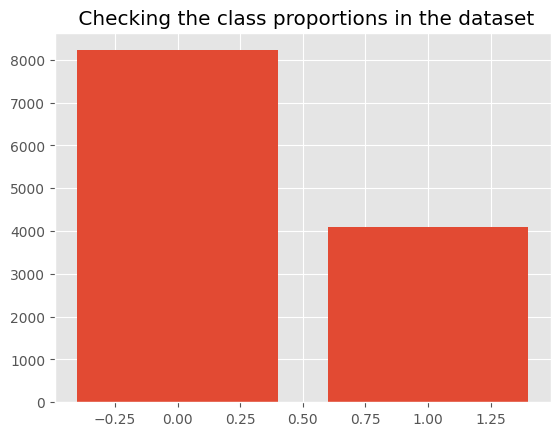

,label
NOT,619
OFF,308


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


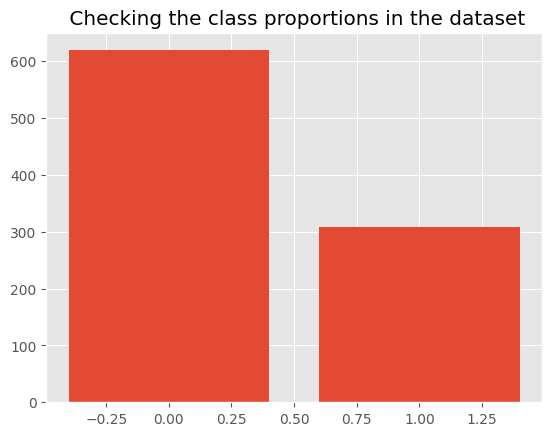



----------------------------------------------------class pie for training--------------------------------------------------------------------


----------------------------------------------------class pie for validation--------------------------------------------------------------------


----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


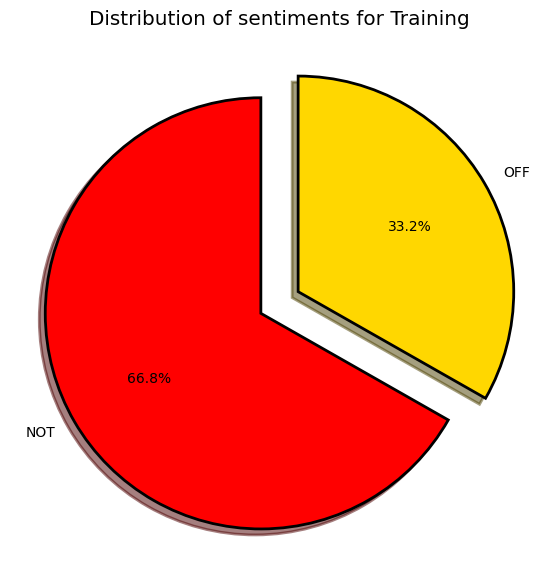

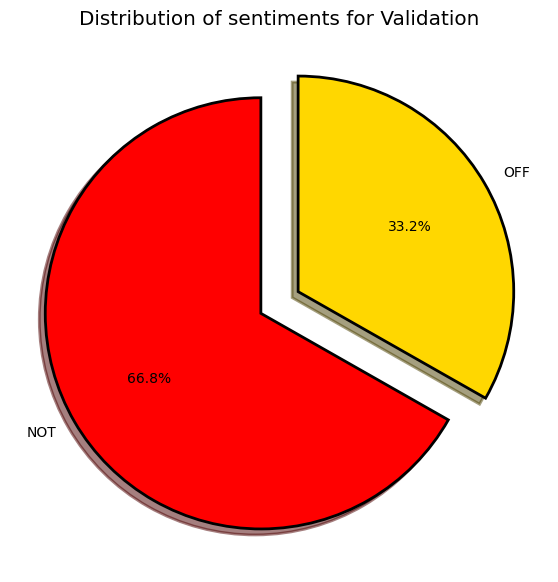

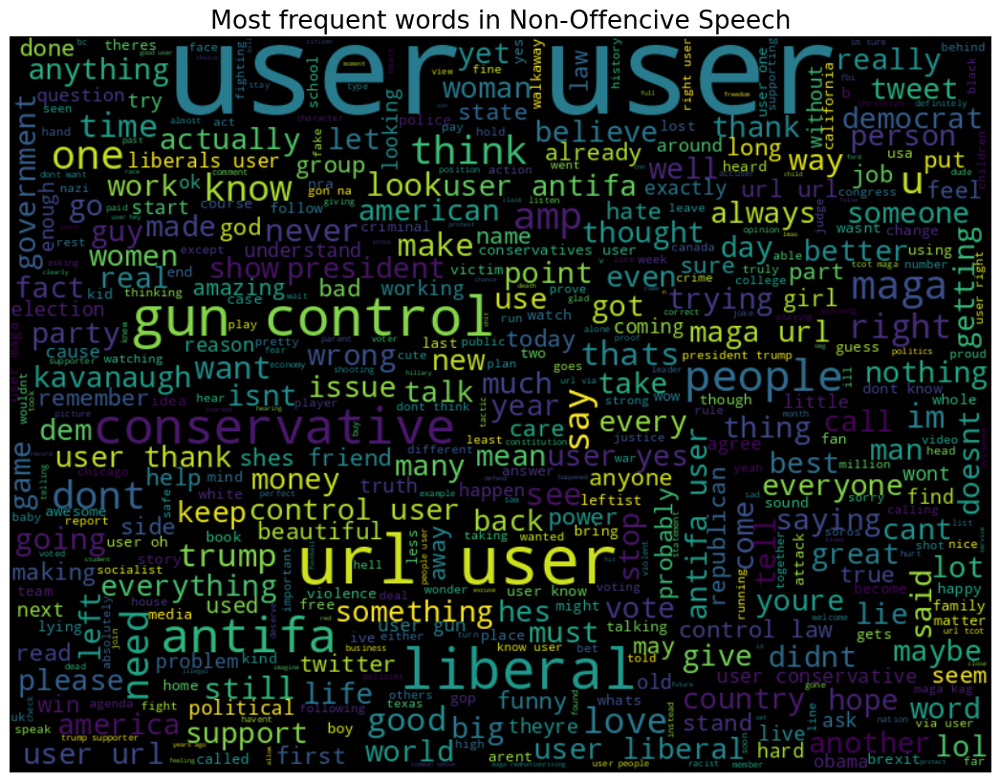

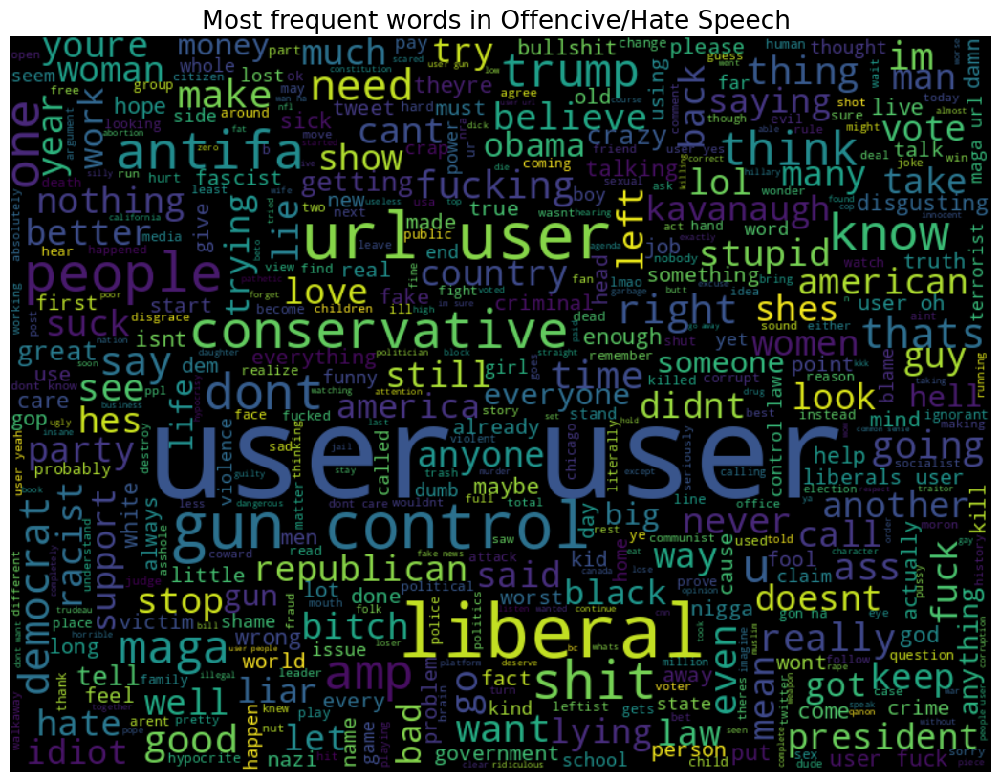

----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


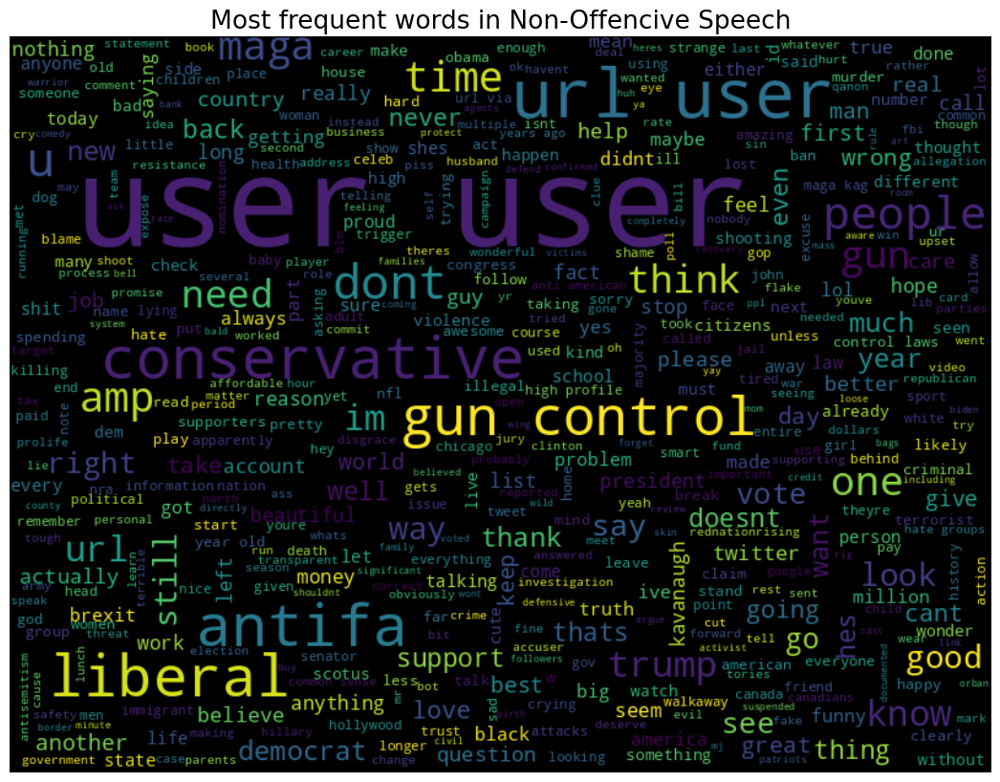

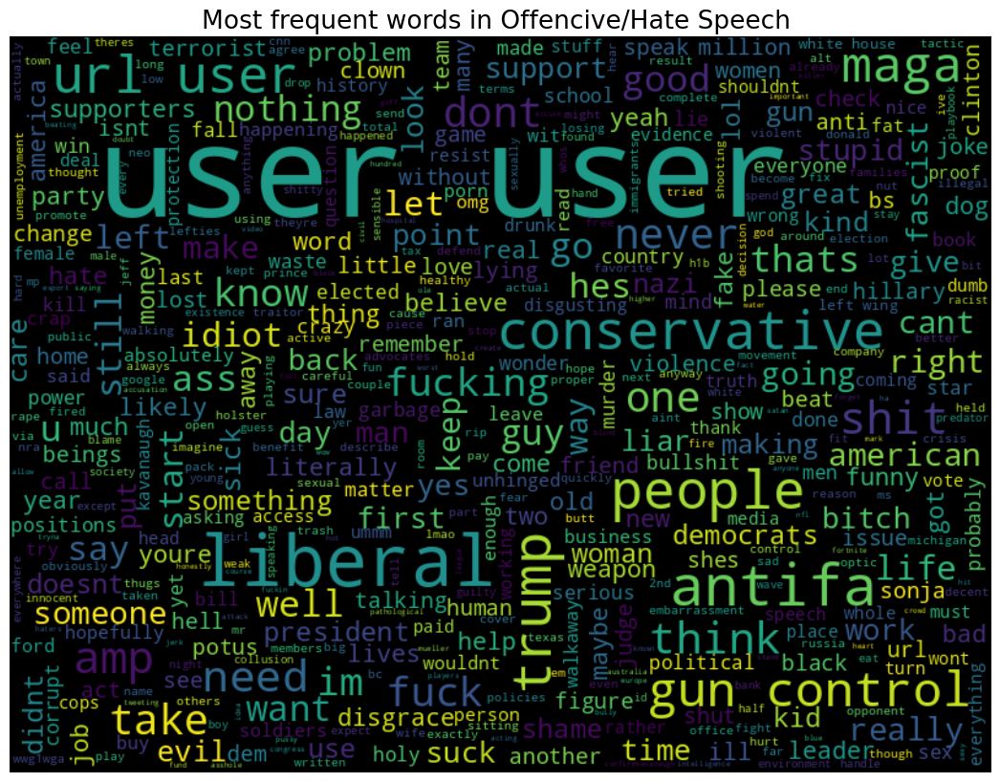

---------------------------------------------- training and testing the model
Let's start training Linear Regression model
Saved model to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/100/model.sav
Saved Vectorizer to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/100/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[8201   20]
 [2225 1867]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.79      1.00      0.88      8221
         OFF       0.99      0.46      0.62      4092

    accuracy                           0.82     12313
   macro avg       0.89      0.73      0.75     12313
weighted avg       0.85      0.82      0.79     12313



------------------------- Displaying the confusion matrix for Training


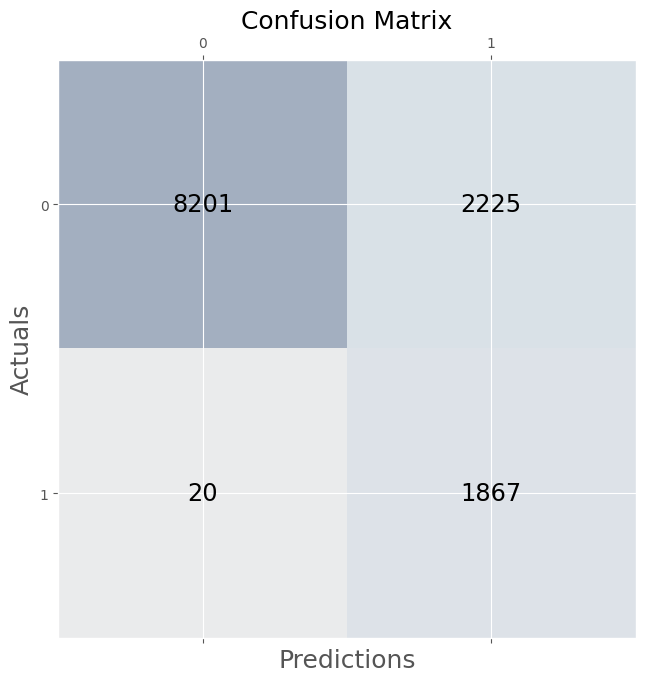



TestingAccuracy: 0.8176723787866482
TestingPrecision: 0.8879961900718831
TestingRecall: 0.7269116577089667
TestingF1-score: 0.7520622243995096


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[600  19]
 [216  92]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.74      0.97      0.84       619
         OFF       0.83      0.30      0.44       308

    accuracy                           0.75       927
   macro avg       0.78      0.63      0.64       927
weighted avg       0.77      0.75      0.70       927



------------------------- Displaying the confusion matrix for Validation


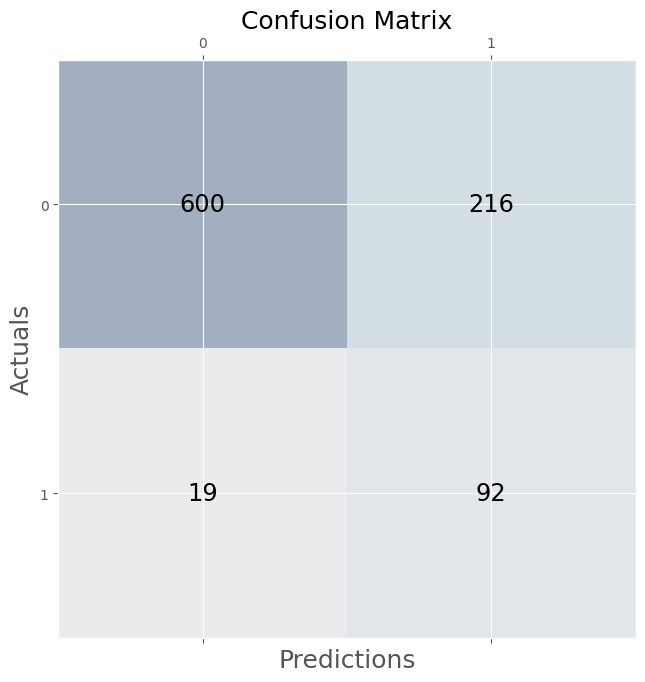



ValidationAccuracy: 0.7464940668824164
ValidationPrecision: 0.7820614732379438
ValidationRecall: 0.6340033149403101
ValidationF1-score: 0.6376888726268783
TestingAccuracy: 0.8176723787866482
TestingPrecision: 0.8879961900718831
TestingRecall: 0.7269116577089667
TestingF1-score: 0.7520622243995096


In [ ]:
print('-----------------------------------Train using of 100% of data----------------------------------------------------------')
model_100_train_acc,model_100_train_prec,model_100_train_recall,model_100_train_f1,model_100_valid_acc,model_100_valid_prec,model_100_valid_recall,model_100_valid_f1 = train_method1(train_file,valid_file, MODEL_1_100_DIRECTORY)

---------------------------------------------------------Train using of 25% of data------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  61407  @USER @USER @USER @USER @USER Really? It's oka...   NOT
1  97595  @USER @USER @USER @USER @USER @USER @USER @USE...   NOT
2  81754  @USER @USER @USER Tippi Hedren was in Julie an...   NOT
3  25016  #PresidentMaduro Feasts with #SaltBae as #Vene...   NOT
4  85796  @USER YOUR TRASH!!!!!!!! But she would have be...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still

,label
NOT,2055
OFF,1023


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


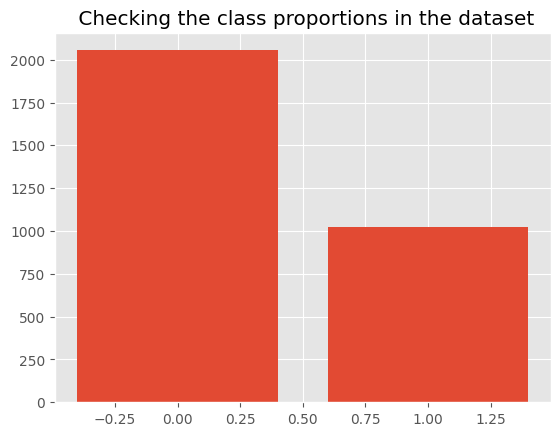

,label
NOT,619
OFF,308


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


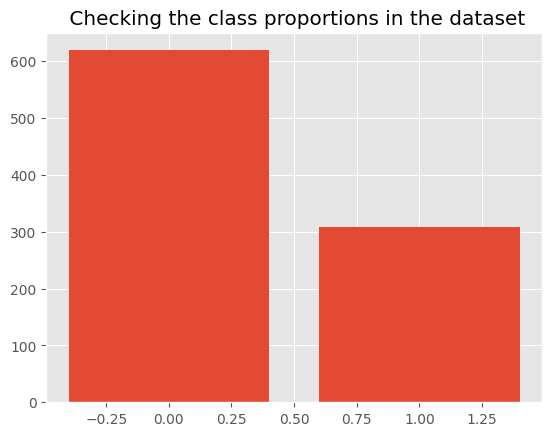



----------------------------------------------------class pie for training--------------------------------------------------------------------


----------------------------------------------------class pie for validation--------------------------------------------------------------------


----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


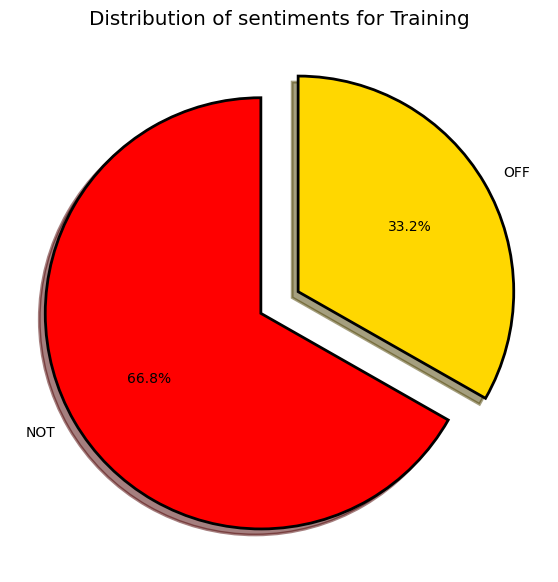

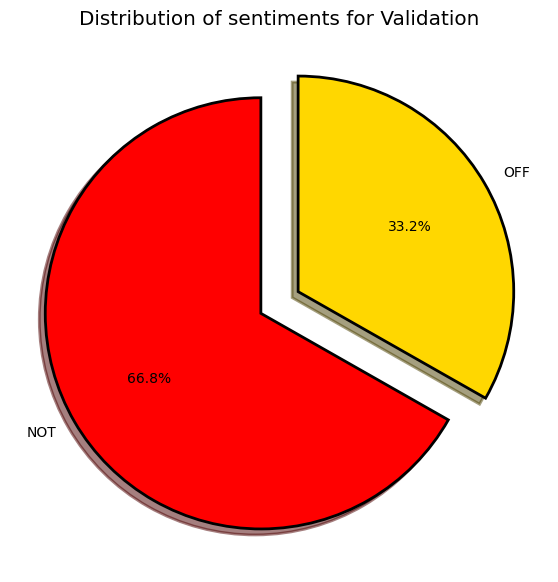

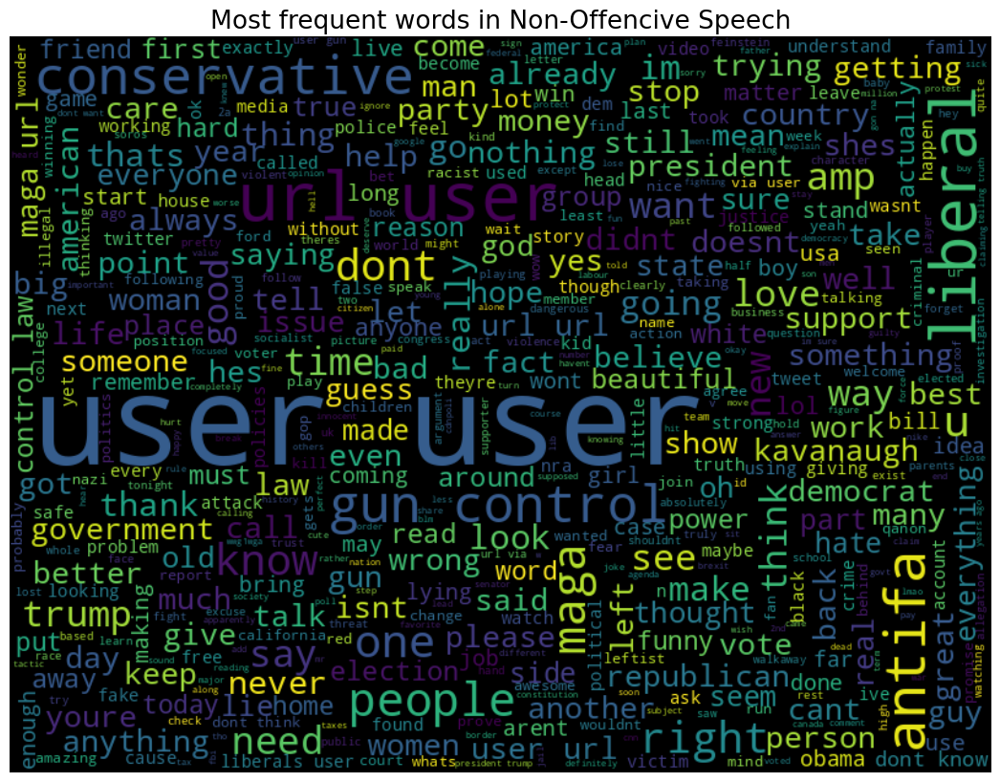

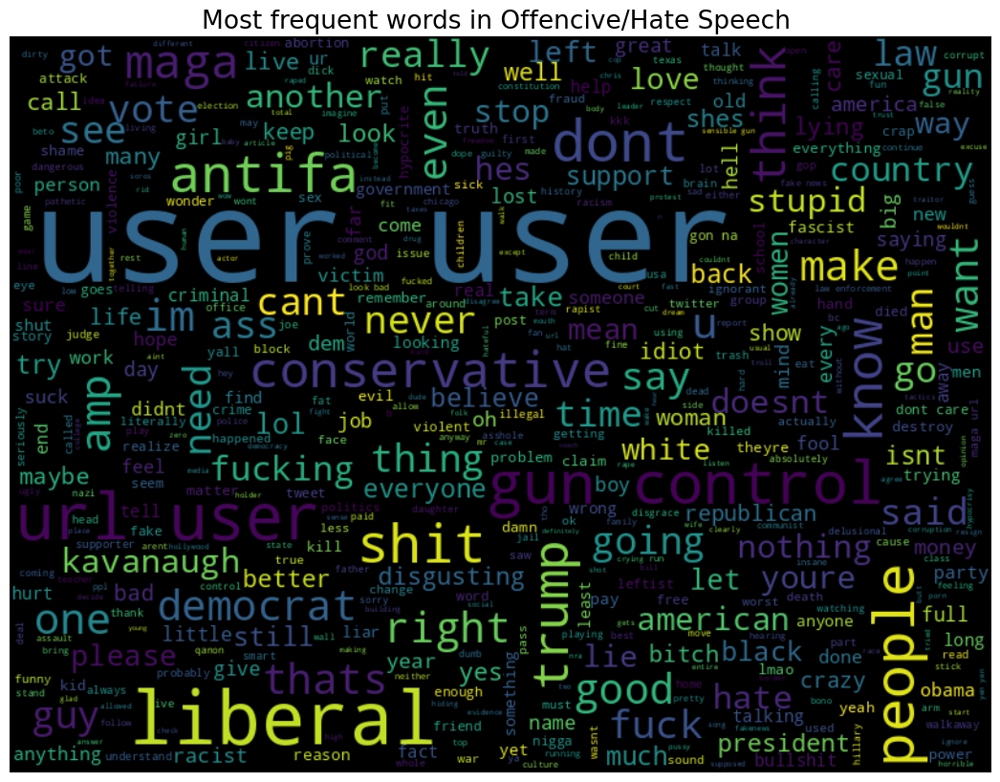

----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


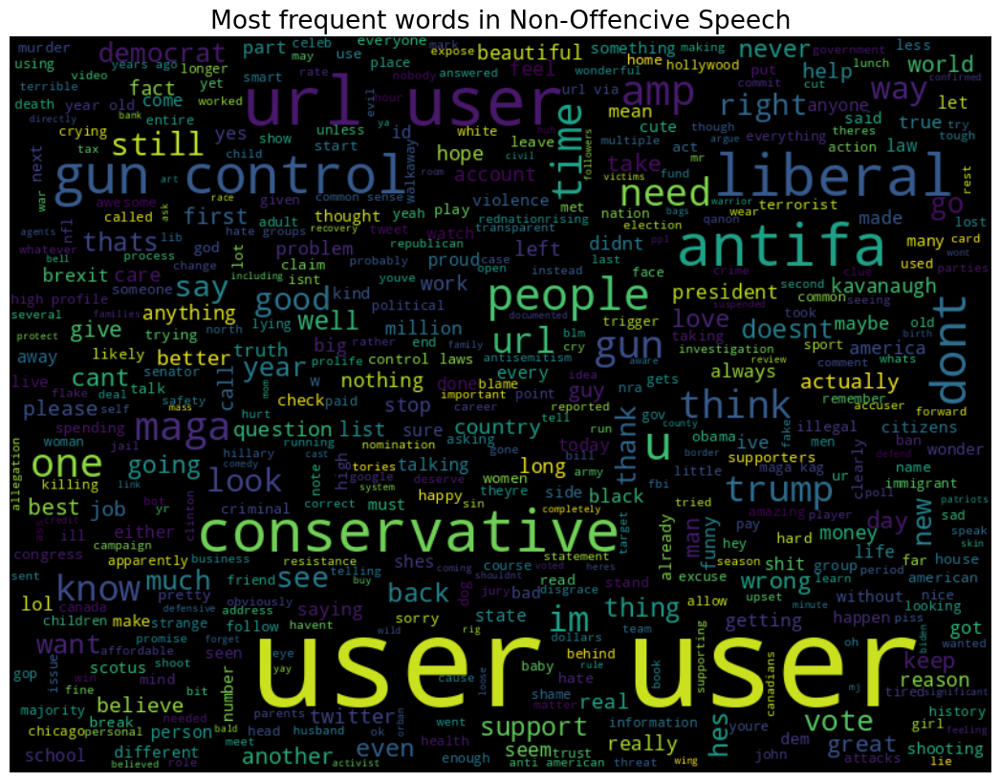

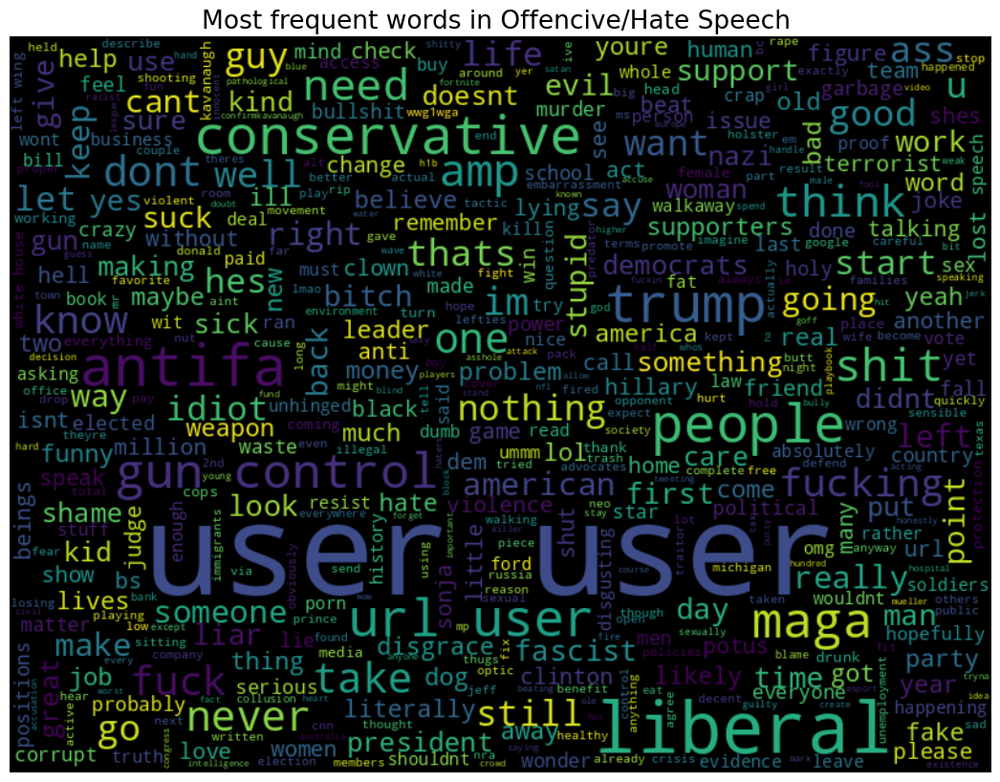

---------------------------------------------- training and testing the model
Let's start training Linear Regression model
Saved model to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25/model.sav
Saved Vectorizer to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[2055    0]
 [ 718  305]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.74      1.00      0.85      2055
         OFF       1.00      0.30      0.46      1023

    accuracy                           0.77      3078
   macro avg       0.87      0.65      0.66      3078
weighted avg       0.83      0.77      0.72      3078



------------------------- Displaying the confusion matrix for Training


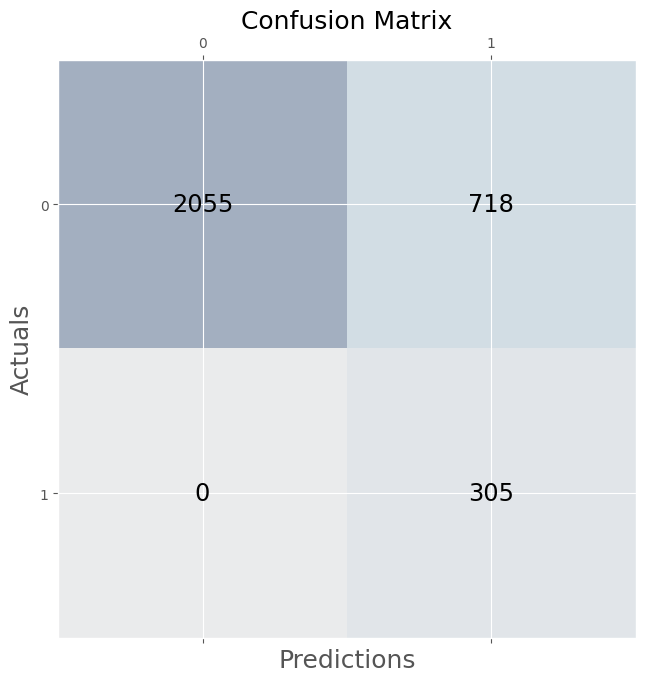



TestingAccuracy: 0.7667316439246263
TestingPrecision: 0.87053732419762
TestingRecall: 0.6490713587487781
TestingF1-score: 0.6553107625198391


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[613   6]
 [265  43]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.70      0.99      0.82       619
         OFF       0.88      0.14      0.24       308

    accuracy                           0.71       927
   macro avg       0.79      0.56      0.53       927
weighted avg       0.76      0.71      0.63       927



------------------------- Displaying the confusion matrix for Validation


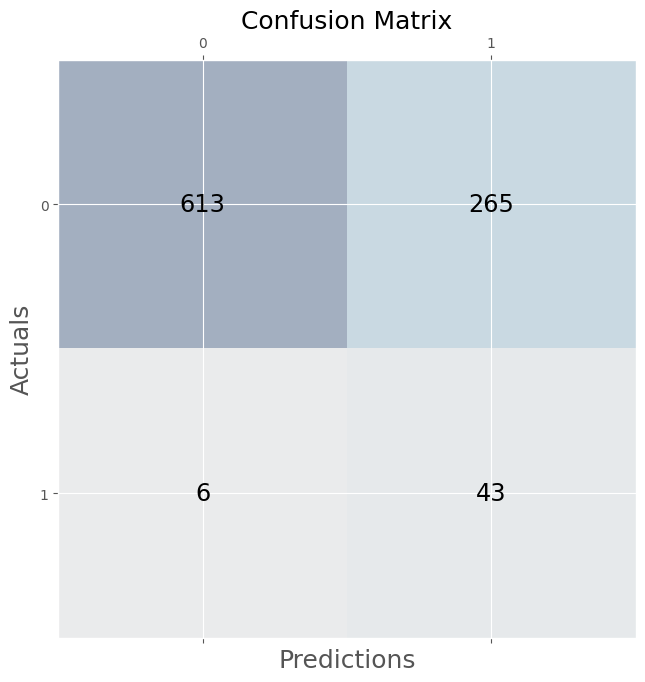



ValidationAccuracy: 0.7076591154261057
ValidationPrecision: 0.7878643484728743
ValidationRecall: 0.5649586681492982
ValidationF1-score: 0.5299338172142605
TestingAccuracy: 0.7667316439246263
TestingPrecision: 0.87053732419762
TestingRecall: 0.6490713587487781
TestingF1-score: 0.6553107625198391


In [ ]:
# training the model on 25% of train data
print('---------------------------------------------------------Train using of 25% of data------------------------------------')


model_25_train_acc,model_25_train_prec,model_25_train_recall,model_25_train_f1,model_25_valid_acc,model_25_valid_prec,model_25_valid_recall,model_25_valid_f1 = train_method1(train_25_file,valid_file, MODEL_1_25_DIRECTORY)

0.8176723787866482

---------------------------------------------------------Train using of 50% of data------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  61407  @USER @USER @USER @USER @USER Really? It's oka...   NOT
1  97595  @USER @USER @USER @USER @USER @USER @USER @USE...   NOT
2  81754  @USER @USER @USER Tippi Hedren was in Julie an...   NOT
3  25016  #PresidentMaduro Feasts with #SaltBae as #Vene...   NOT
4  85796  @USER YOUR TRASH!!!!!!!! But she would have be...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still

,label
NOT,5138
OFF,2557


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


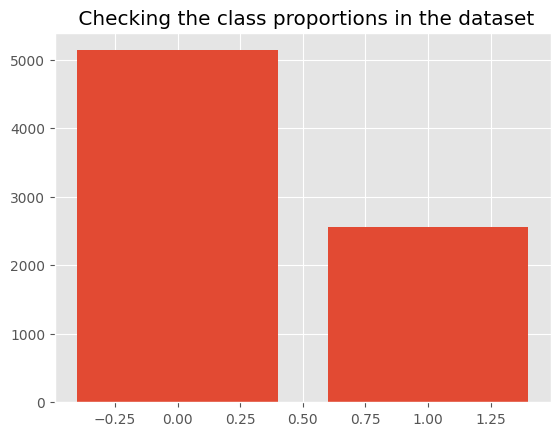

,label
NOT,619
OFF,308


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


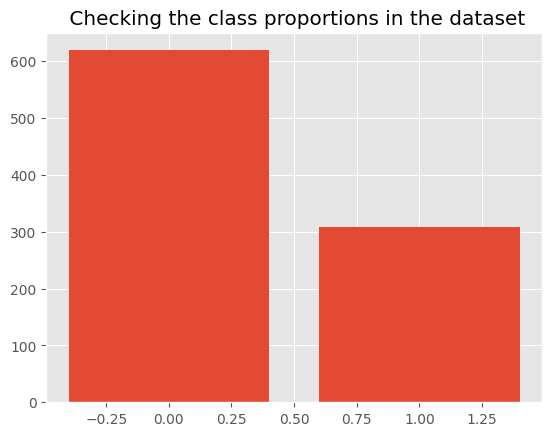



----------------------------------------------------class pie for training--------------------------------------------------------------------


----------------------------------------------------class pie for validation--------------------------------------------------------------------


----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


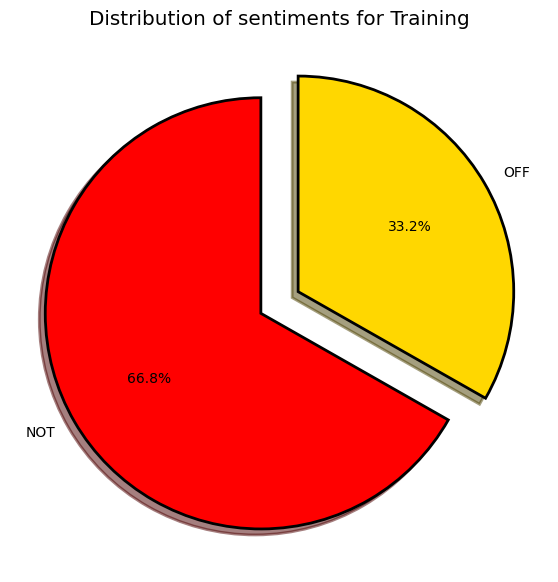

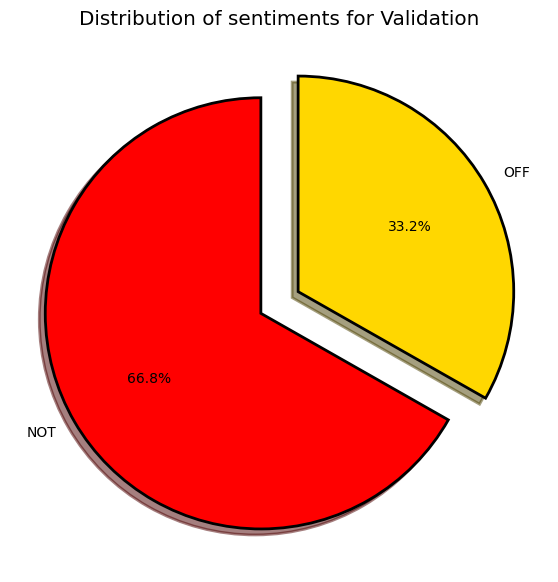

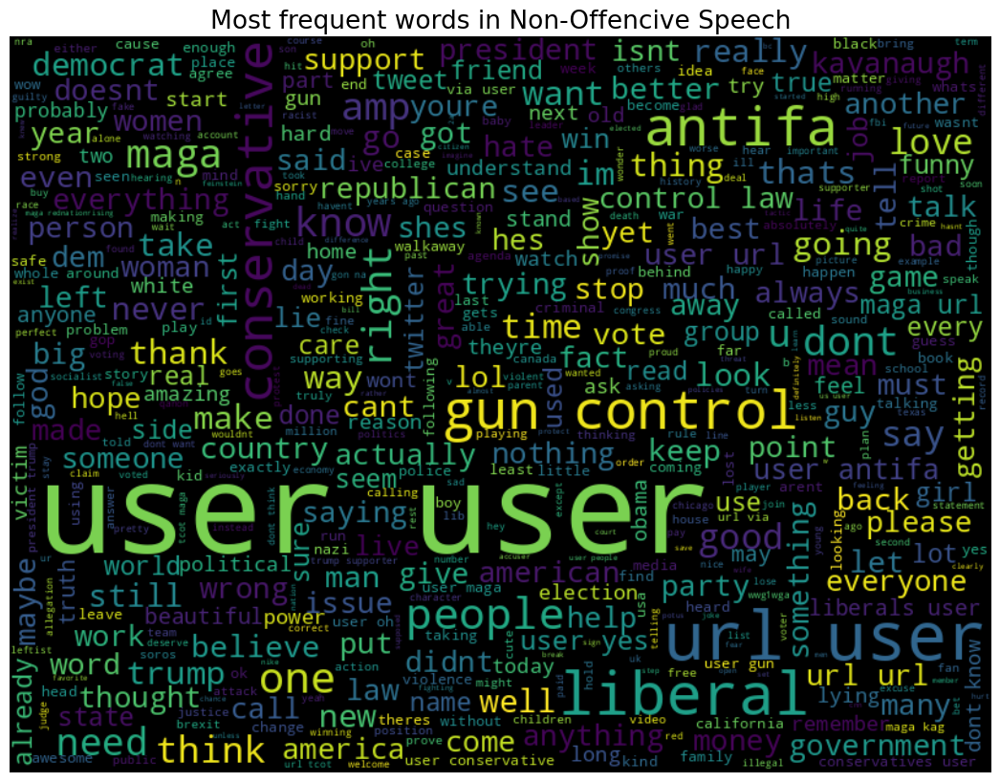

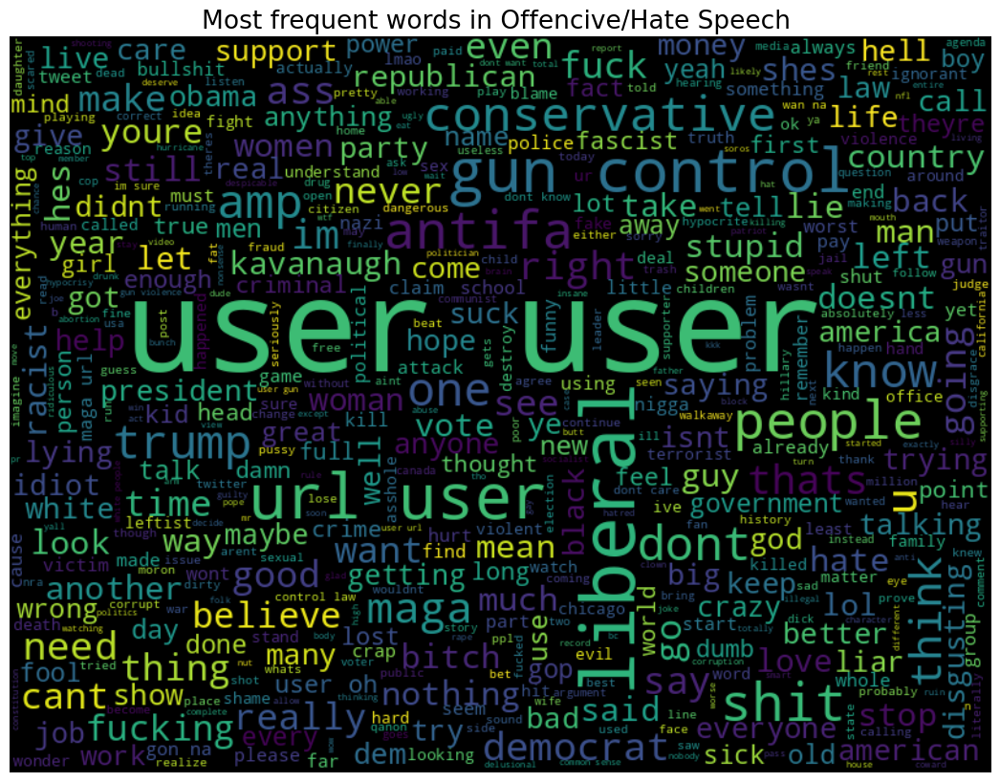

----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


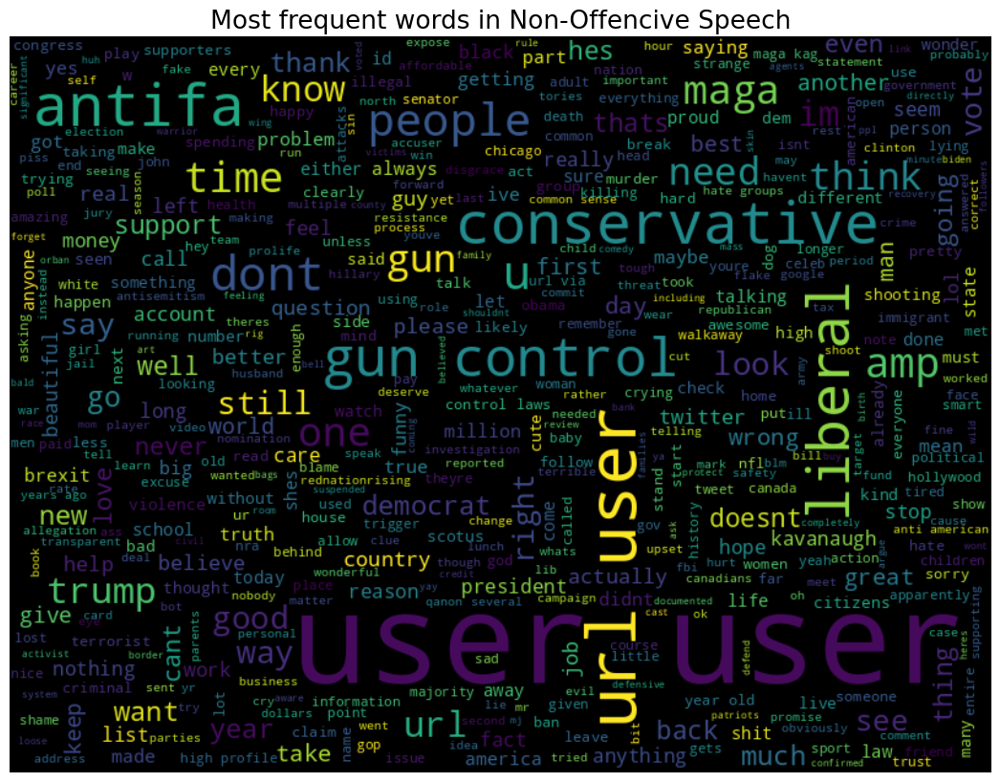

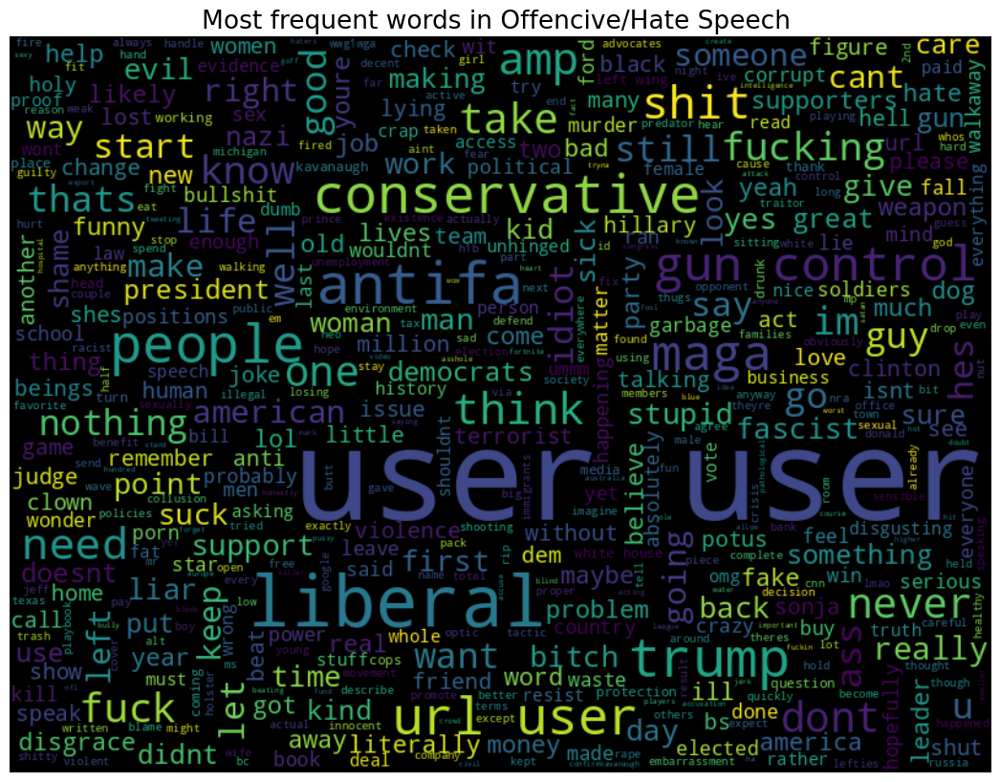

---------------------------------------------- training and testing the model
Let's start training Linear Regression model
Saved model to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50/model.sav
Saved Vectorizer to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[5132    6]
 [1500 1057]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.77      1.00      0.87      5138
         OFF       0.99      0.41      0.58      2557

    accuracy                           0.80      7695
   macro avg       0.88      0.71      0.73      7695
weighted avg       0.85      0.80      0.78      7695



------------------------- Displaying the confusion matrix for Training


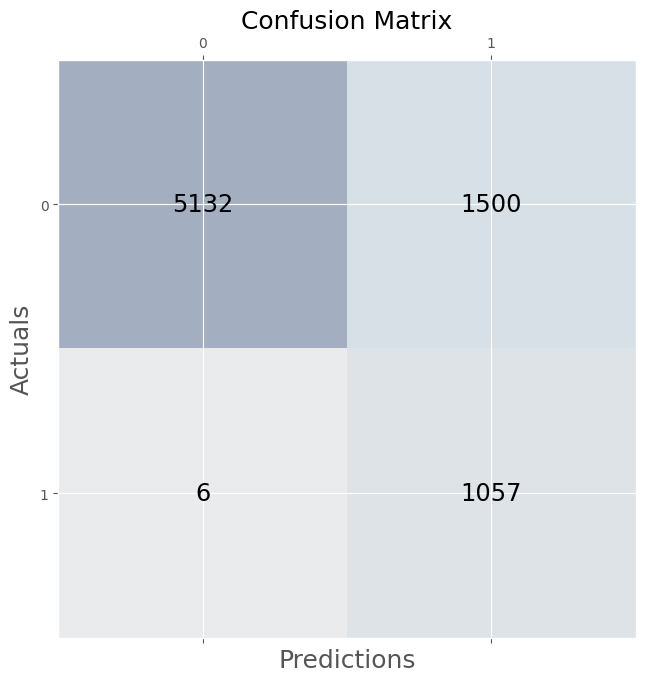



TestingAccuracy: 0.8042884990253412
TestingPrecision: 0.8840897407818871
TestingRecall: 0.7061036396626362
TestingF1-score: 0.7280127395710604


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[608  11]
 [235  73]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.72      0.98      0.83       619
         OFF       0.87      0.24      0.37       308

    accuracy                           0.73       927
   macro avg       0.80      0.61      0.60       927
weighted avg       0.77      0.73      0.68       927



------------------------- Displaying the confusion matrix for Validation


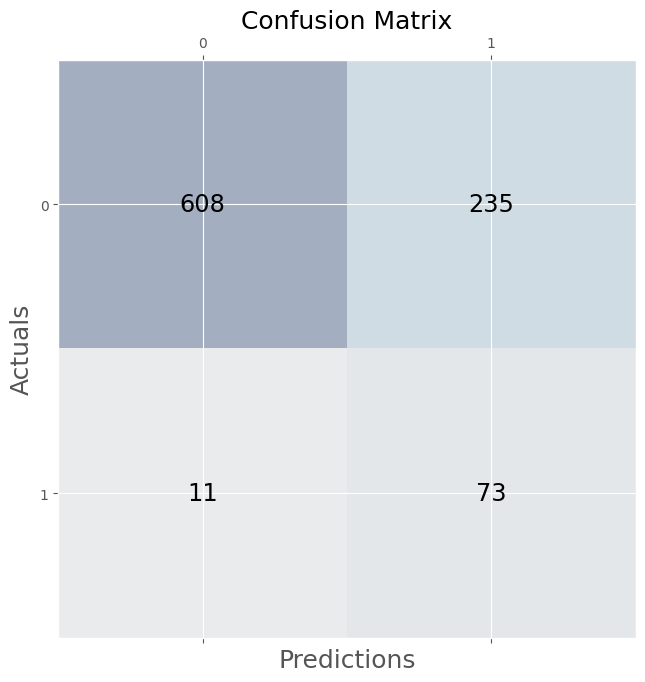



ValidationAccuracy: 0.7346278317152104
ValidationPrecision: 0.7951406541264192
ValidationRecall: 0.6096211946373498
ValidationF1-score: 0.602093162846534
TestingAccuracy: 0.8042884990253412
TestingPrecision: 0.8840897407818871
TestingRecall: 0.7061036396626362
TestingF1-score: 0.7280127395710604


In [ ]:
# training the model on 50% of train data
print('---------------------------------------------------------Train using of 50% of data------------------------------------')
model_50_train_acc,model_50_train_prec,model_50_train_recall,model_50_train_f1,model_50_valid_acc,model_50_valid_prec,model_50_valid_recall,model_50_valid_f1 = train_method1(train_50_file,valid_file, MODEL_1_50_DIRECTORY)

---------------------------------------------------------Train using of 75% of data------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  61407  @USER @USER @USER @USER @USER Really? It's oka...   NOT
1  97595  @USER @USER @USER @USER @USER @USER @USER @USE...   NOT
2  81754  @USER @USER @USER Tippi Hedren was in Julie an...   NOT
3  25016  #PresidentMaduro Feasts with #SaltBae as #Vene...   NOT
4  85796  @USER YOUR TRASH!!!!!!!! But she would have be...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still

,label
NOT,7450
OFF,3708


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


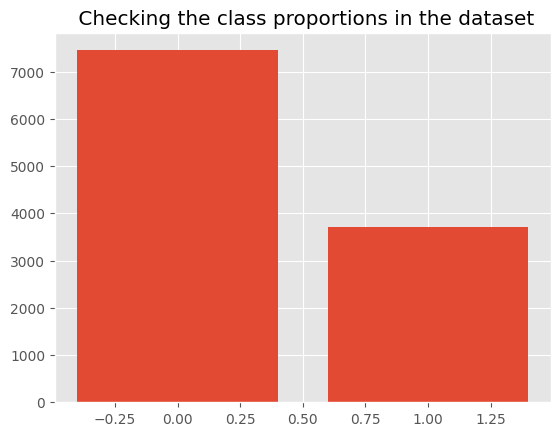

,label
NOT,619
OFF,308


0s : 1s  ::   2.01 : 1
--------------------------"0" signifies non-offencive text & "1" signifies offensive/Hate text


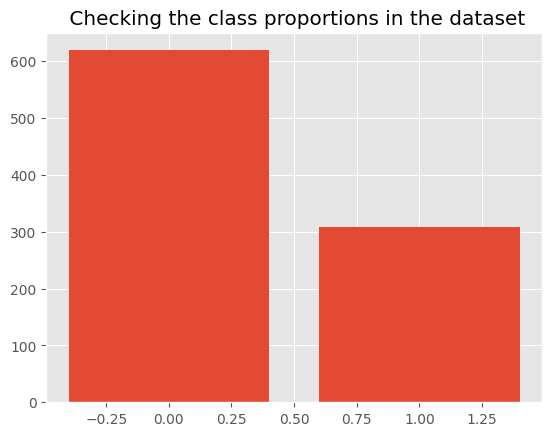



----------------------------------------------------class pie for training--------------------------------------------------------------------


----------------------------------------------------class pie for validation--------------------------------------------------------------------


----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


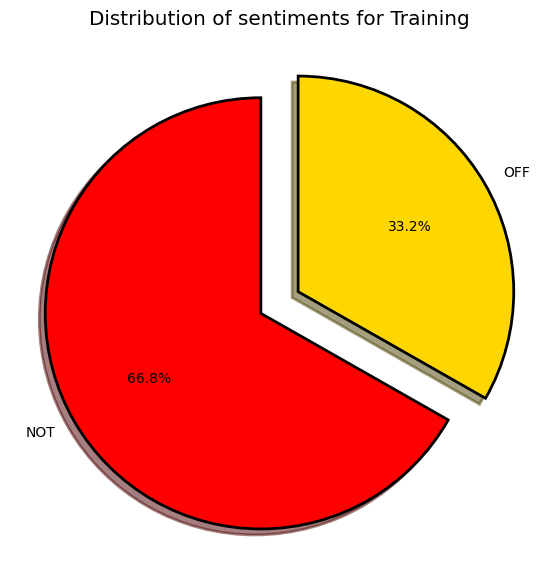

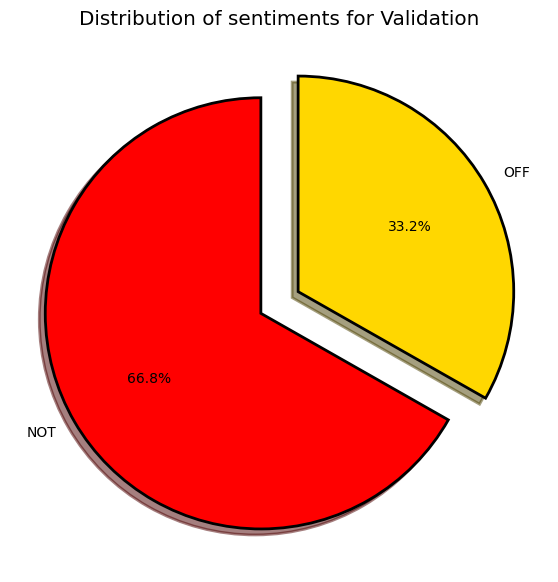

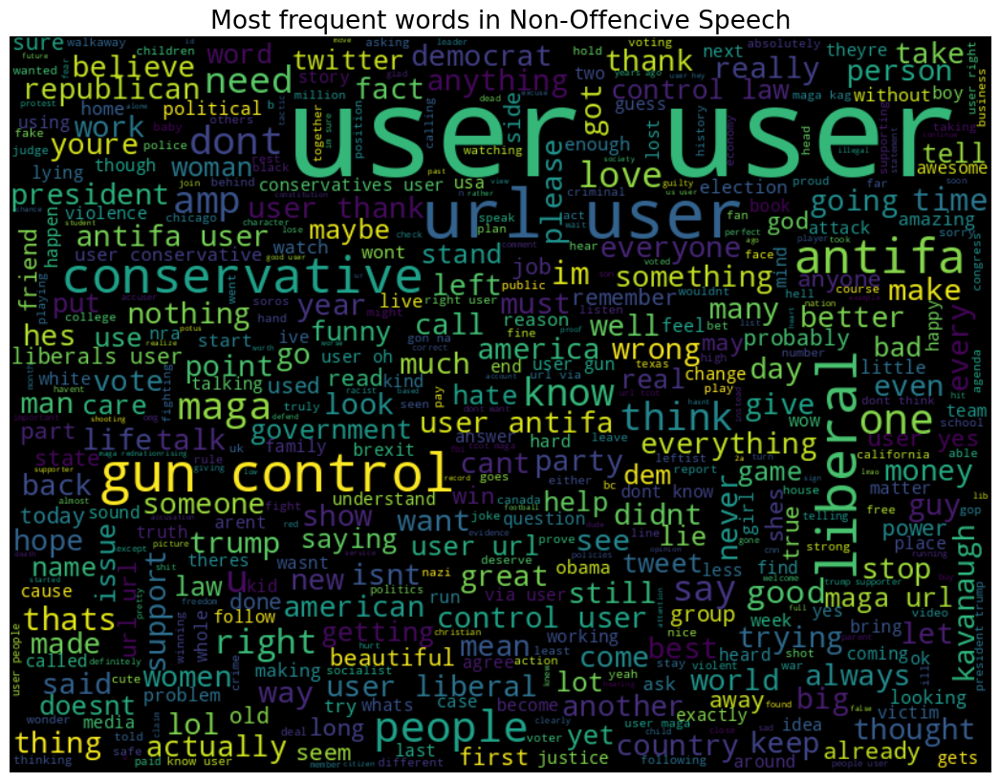

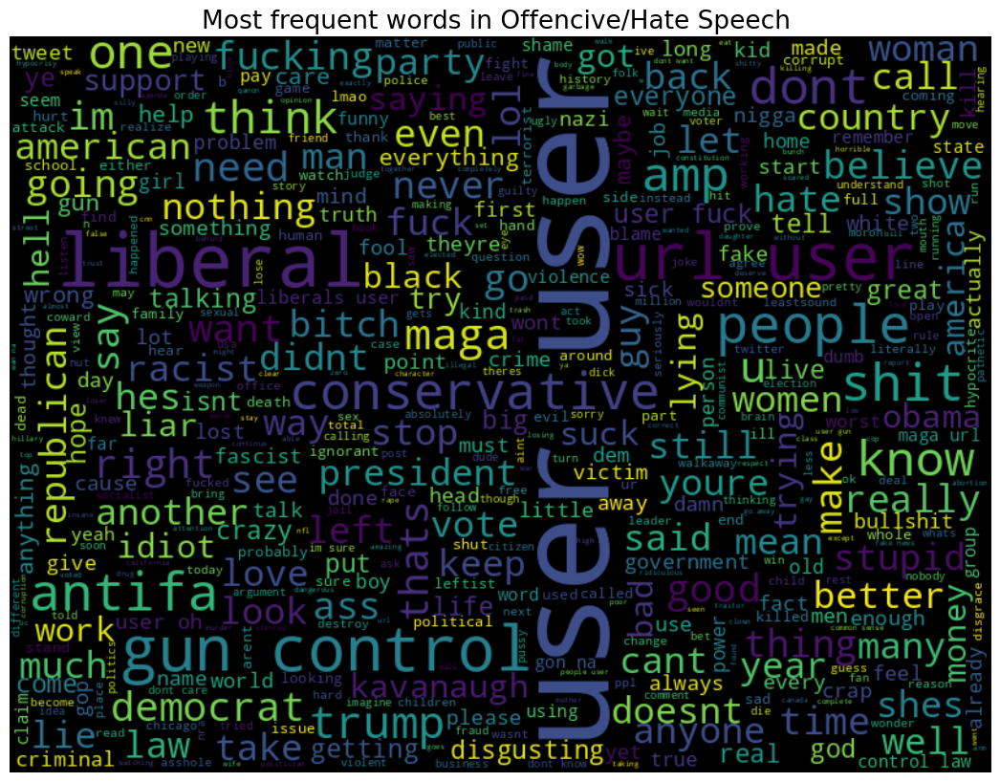

----------------------------------------------------Word cloud for Training data--------------------------------------------------------------------


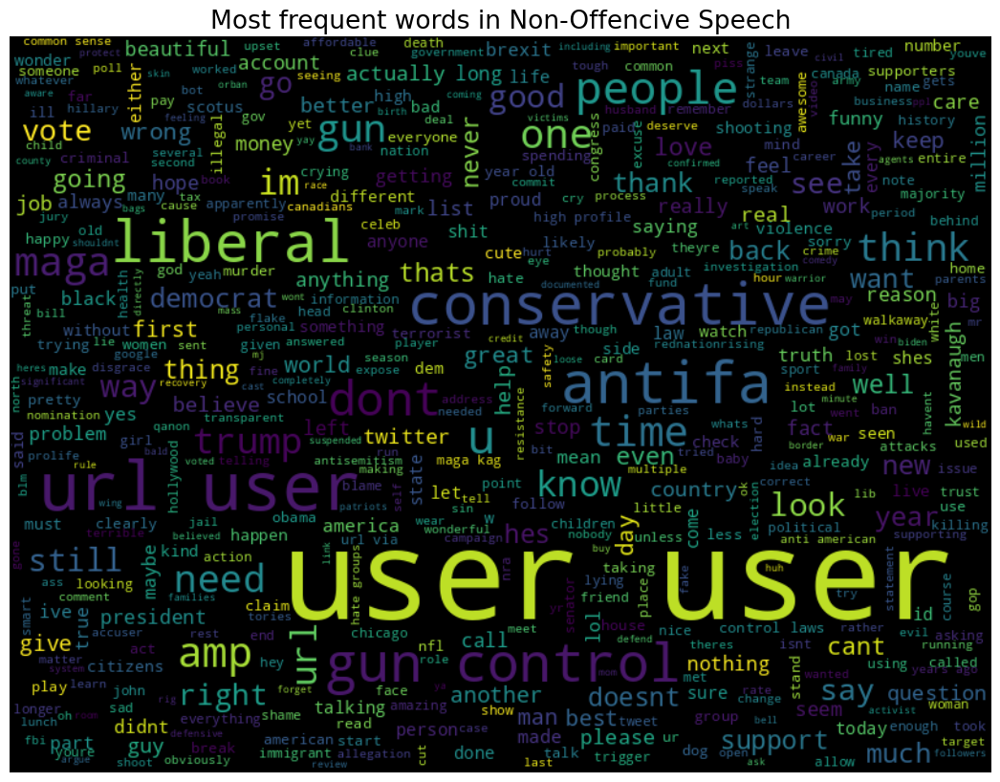

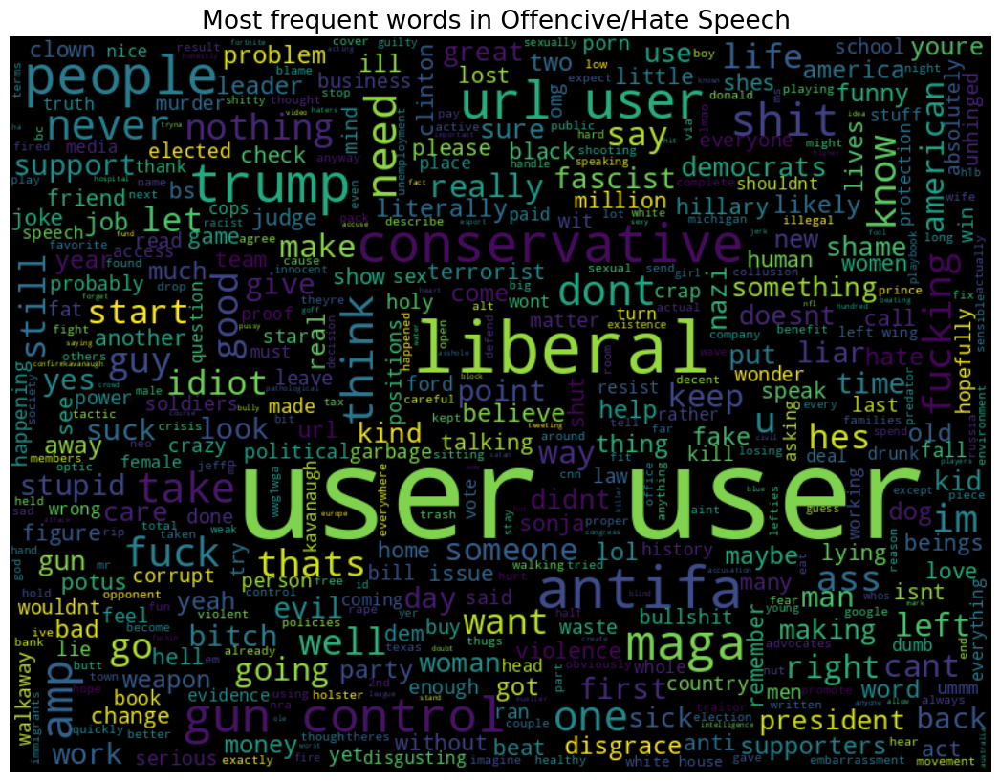

---------------------------------------------- training and testing the model
Let's start training Linear Regression model
Saved model to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/75/model.sav
Saved Vectorizer to  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/75/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[7435   15]
 [2044 1664]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.78      1.00      0.88      7450
         OFF       0.99      0.45      0.62      3708

    accuracy                           0.82     11158
   macro avg       0.89      0.72      0.75     11158
weighted avg       0.85      0.82      0.79     11158



------------------------- Displaying the confusion matrix for Training


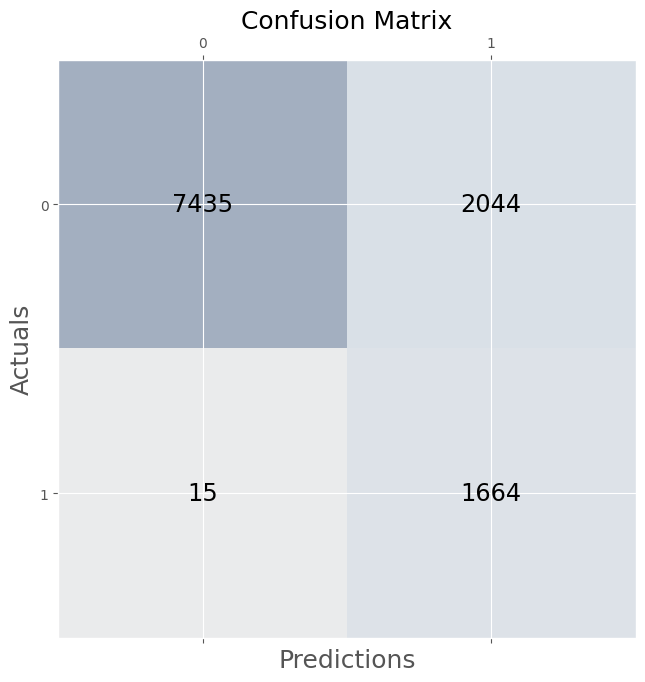



TestingAccuracy: 0.8154687219931888
TestingPrecision: 0.8877157750862836
TestingRecall: 0.7233730081159546
TestingF1-score: 0.7480789700721375


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[600  19]
 [217  91]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.73      0.97      0.84       619
         OFF       0.83      0.30      0.44       308

    accuracy                           0.75       927
   macro avg       0.78      0.63      0.64       927
weighted avg       0.77      0.75      0.70       927



------------------------- Displaying the confusion matrix for Validation


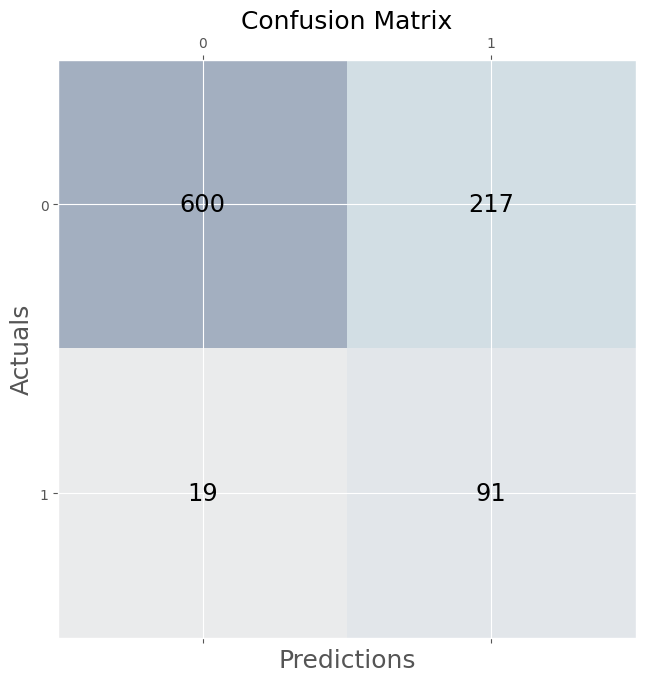



ValidationAccuracy: 0.7454153182308522
ValidationPrecision: 0.7808334260598642
ValidationRecall: 0.6323799383169335
ValidationF1-score: 0.6355306473324359
TestingAccuracy: 0.8154687219931888
TestingPrecision: 0.8877157750862836
TestingRecall: 0.7233730081159546
TestingF1-score: 0.7480789700721375


In [ ]:
# training the model on 75% of train data
print('---------------------------------------------------------Train using of 75% of data------------------------------------')


model_75_train_acc,model_75_train_prec,model_75_train_recall,model_75_train_f1,model_75_valid_acc,model_75_valid_prec,model_75_valid_recall,model_75_valid_f1 = train_method1(train_75_file,valid_file, MODEL_1_75_DIRECTORY)

# Testing Model 1

In [ ]:
def test_method1(test_file, model_file, vectorizer_file, output_dir):
    """
     take test_file, model_file and output_dir as input.
     It loads model and test of the examples in the test_file.
     It prints different evaluation metrics, and saves the output in output directory

     ADD Other arguments, if needed

    Args:
        test_file: Test file name
        model_file: Model file name
        vectorizer_file: Vectorizer file name
        output_dir: Output Directory

    """

    test_df = read_data(test_file,'Testing Dataset') # loading the dataset


    test_label = test_df['label']

    model, vectorizer = load_model1(model_file, vectorizer_file)  # loading the saved model and vectorizer

    test_values= prepare_dataset1(test_df,vectorizer) # applying pre preprocessing

    test_pred_label = model.predict(test_values) # predecting the output

    test_df['out_label']  = test_pred_label # Note how this is saved

    computing_performance(test_label,test_pred_label,model,'Training',confusion_matrix(test_pred_label,test_label))
    test_acc,test_prec,test_recall,test_f1=evaluate_model(test_label,test_pred_label,'Testing')

    out_file = os.path.join(output_dir, 'output_test.csv')

    print('Saving model output to', out_file)
    test_df.to_csv(out_file)

    return test_acc,test_prec,test_recall,test_f1


Testing using model trained on 100% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/100/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/100/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[607  13]
 [160  80]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.

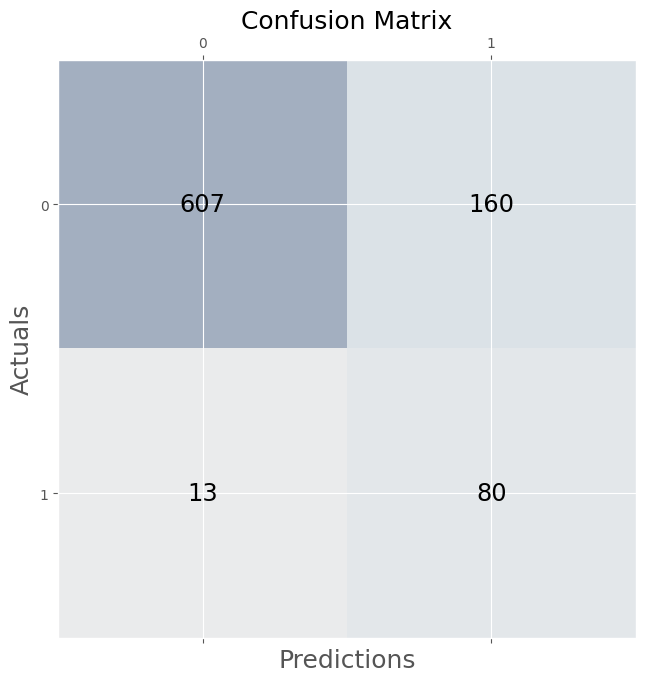

TestingAccuracy: 0.7988372093023256
TestingPrecision: 0.8258050496978873
TestingRecall: 0.6561827956989247
TestingF1-score: 0.6778754240902762
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/1/100/output_test.csv


In [ ]:
print('Testing using model trained on 100% data')

model_1_100_file = os.path.join(MODEL_1_100_DIRECTORY, 'model.sav') # module directory

vectorizer_100_file = os.path.join(MODEL_1_100_DIRECTORY,'vectorizer.sav') #vectorizer directory

model_1_100_test_acc,model_1_100_test_prec,model_1_100_test_recall,model_1_100_test_f1=test_method1(test_file, model_1_100_file, vectorizer_100_file, MODEL_1_100_DIRECTORY) #testing model

Testing the model 1 on 25% of data

Testing using model trained on 25% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[618   2]
 [204  36]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.75 

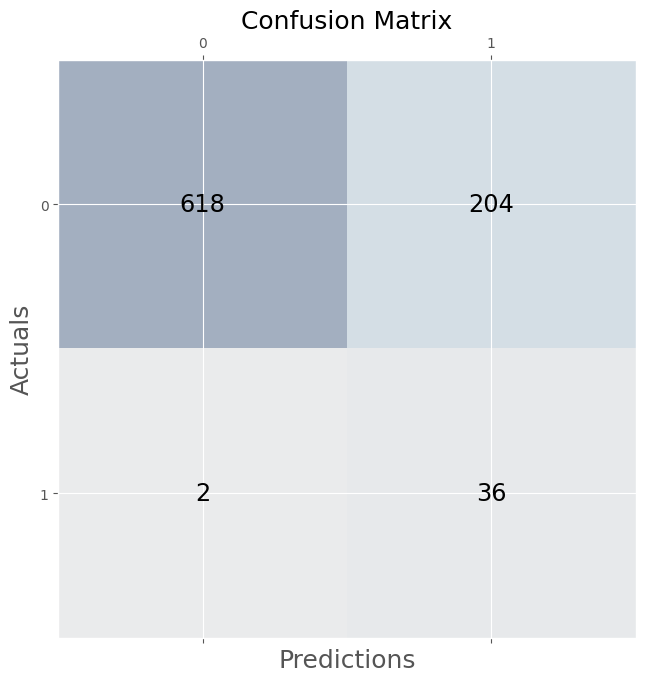

TestingAccuracy: 0.7604651162790698
TestingPrecision: 0.8495966192854398
TestingRecall: 0.5733870967741935
TestingF1-score: 0.5580678314491264
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/1/25/output_test.csv


In [ ]:
print('Testing using model trained on 25% data')

model_1_25_file = os.path.join(MODEL_1_25_DIRECTORY, 'model.sav')

vectorizer_25_file = os.path.join(MODEL_1_25_DIRECTORY,'vectorizer.sav')

model_1_25_test_acc,model_1_25_test_prec,model_1_25_test_recall,model_1_25_test_f1=test_method1(test_file, model_1_25_file, vectorizer_25_file, MODEL_1_25_DIRECTORY)

Testing using model trained on 50% data

Testing using model trained on 50% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[612   8]
 [170  70]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.78 

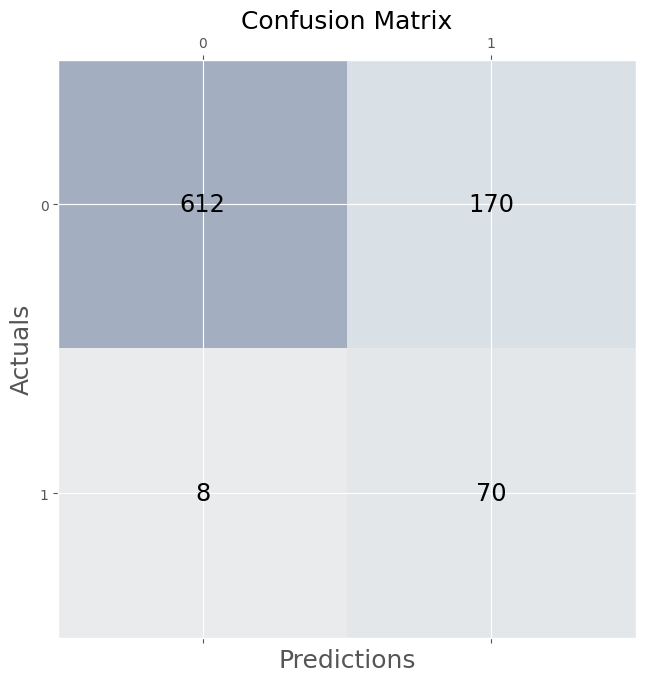

TestingAccuracy: 0.7930232558139535
TestingPrecision: 0.8400222965440357
TestingRecall: 0.6393817204301075
TestingF1-score: 0.6566450443660898
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/1/50/output_test.csv


In [ ]:
print('Testing using model trained on 50% data')
model_1_50_file = os.path.join(MODEL_1_50_DIRECTORY, 'model.sav')

vectorizer_50_file = os.path.join(MODEL_1_50_DIRECTORY,'vectorizer.sav')

model_1_50_test_acc,model_1_50_test_prec,model_1_50_test_recall,model_1_50_test_f1=test_method1(test_file, model_1_50_file, vectorizer_50_file, MODEL_1_50_DIRECTORY)

Testing using model trained on 75% data



Testing using model trained on 75% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/75/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/75/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[609  11]
 [160  80]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.79 

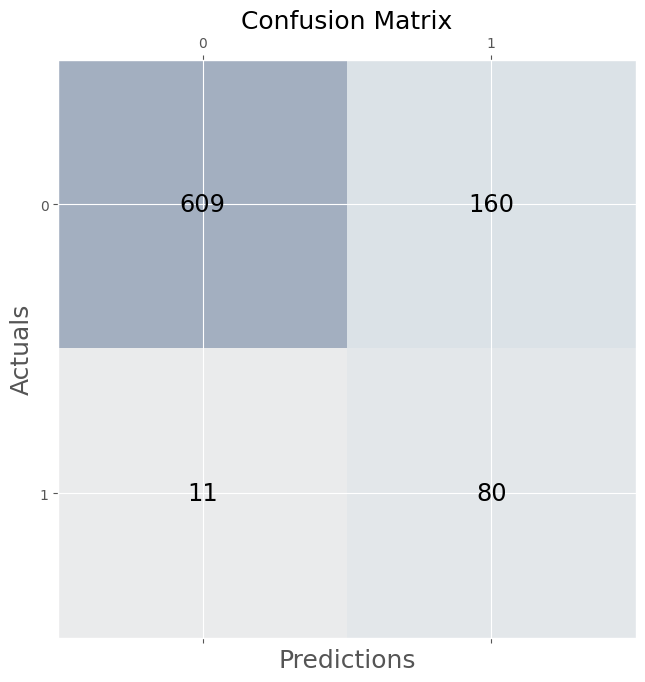

TestingAccuracy: 0.8011627906976744
TestingPrecision: 0.8355292301976307
TestingRecall: 0.6577956989247312
TestingF1-score: 0.6801367673063496
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/1/75/output_test.csv


In [ ]:
print('Testing using model trained on 75% data')

model_1_75_file = os.path.join(MODEL_1_75_DIRECTORY, 'model.sav')

vectorizer_75_file = os.path.join(MODEL_1_75_DIRECTORY,'vectorizer.sav')

model_1_75_test_acc,model_1_75_test_prec,model_1_75_test_recall,model_1_75_test_f1=test_method1(test_file, model_1_75_file, vectorizer_75_file, MODEL_1_75_DIRECTORY)

## PreProcessing for Model 2

In [ ]:
# Creating and checking

MODEL_2_DIRECTORY = os.path.join(GOOGLE_DRIVE_PATH, 'models', '2') # Model 2 directory
chk_directory(MODEL_2_DIRECTORY)   # check if the specified path exists in the directory
print('Model 2 directory: ', MODEL_2_DIRECTORY)

MODEL_2_25_DIRECTORY = os.path.join(MODEL_2_DIRECTORY,'25') # Model 2 trained using 25% of train data directory
chk_directory(MODEL_2_25_DIRECTORY)   # check if the specified path exists in the directory

print('Model 2 directory with 25% data: ', MODEL_2_25_DIRECTORY)

model_2_25_output_test_file = os.path.join(MODEL_2_25_DIRECTORY, 'output_test.csv') # Output file using Model 2 trained using 25% of train data
print('Output file name using model 2 using 25% of train data: ',model_2_25_output_test_file)



MODEL_2_50_DIRECTORY = os.path.join(MODEL_2_DIRECTORY,'50') # Model 2 trained using 50% of train data directory
chk_directory(MODEL_2_50_DIRECTORY)   # check if the specified path exists in the directory
print('Model 2 directory with 50% data: ', MODEL_2_50_DIRECTORY)

model_2_50_output_test_file = os.path.join(MODEL_2_50_DIRECTORY, 'output_test.csv') # Output file using Model 2 trained using 50% of train data
print('Output file name using model 2 using 50% of train data: ',model_2_50_output_test_file)



MODEL_2_75_DIRECTORY = os.path.join(MODEL_2_DIRECTORY,'75') # Model 2 trained using 75% of train data directory
chk_directory(MODEL_2_75_DIRECTORY)   # check if the specified path exists in the directory
print('Model 2 directory with 75% data: ', MODEL_1_75_DIRECTORY)

model_2_75_output_test_file = os.path.join(MODEL_2_75_DIRECTORY, 'output_test.csv') # Output file using Model 2 trained using 75% of train data
print('Output file name using model 2 using 75% of train data: ',model_2_75_output_test_file)


MODEL_2_100_DIRECTORY = os.path.join(MODEL_2_DIRECTORY,'100') # Model 2 trained using 100% of train data directory
chk_directory(MODEL_2_100_DIRECTORY)   # check if the specified path exists in the directory
print('Model 2 directory with 100% data: ', MODEL_2_100_DIRECTORY)

model_2_100_output_test_file = os.path.join(MODEL_2_100_DIRECTORY, 'output_test.csv') # Output file using Model 2 trained using 100% of train data
print('Output file name using model 2 using 100% of train data: ',model_2_100_output_test_file)

vectorizer_2_25_file = os.path.join(MODEL_2_25_DIRECTORY,'vectorizer.sav')

vectorizer_2_50_file = os.path.join(MODEL_2_50_DIRECTORY,'vectorizer.sav')

vectorizer_2_75_file = os.path.join(MODEL_2_75_DIRECTORY,'vectorizer.sav')

vectorizer_2_100_file = os.path.join(MODEL_2_100_DIRECTORY,'vectorizer.sav')


model_2_25_file = os.path.join(MODEL_2_25_DIRECTORY, 'model.sav')

model_2_100_file = os.path.join(MODEL_2_100_DIRECTORY, 'model.sav')

model_2_50_file = os.path.join(MODEL_2_50_DIRECTORY, 'model.sav')

model_2_75_file = os.path.join(MODEL_2_75_DIRECTORY, 'model.sav')

model_2 = 'Random Forest'

Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/2' already exists.
Model 2 directory:  gdrive/MyDrive/CE807/Assignment2/2202326/models/2
Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/2/25' already exists.
Model 2 directory with 25% data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/25
Output file name using model 2 using 25% of train data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/25/output_test.csv
Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/2/50' already exists.
Model 2 directory with 50% data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/50
Output file name using model 2 using 50% of train data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/50/output_test.csv
Directory 'gdrive/MyDrive/CE807/Assignment2/2202326/models/2/75' already exists.
Model 2 directory with 75% data:  gdrive/MyDrive/CE807/Assignment2/2202326/models/1/75
Output file name using model 2 using 75% of train data:  gdrive/MyDrive/CE807/Assignment2/220232

In [ ]:
# def preprocess_text(text):
#     text = text.lower()
#     text = ''.join([char for char in text if char not in string.punctuation])
#     text = ' '.join([word for word in text.split() if word not in stop_words])
#     return text

In [ ]:
def prepare_dataset2(data, count_vectorizer=None, split='test'):

  if split == 'train':
      count_vectorizer = CountVectorizer(stop_words='english',max_features=5000)
      values = count_vectorizer.fit_transform(data['tweet'].values) #TODO: This is the best way to do this, because you need to use same vectorization menthod
  else:
      values = count_vectorizer.transform(data['tweet'].values)

  if split == 'train':
      return values, count_vectorizer
  else:
      return values

In [ ]:
# Train model 2
def train_model2(text_vector,label):


# Train the Random Forest Classifier using the best hyperparameters
  rfc = RandomForestClassifier(n_estimators=50,
                             min_samples_split=5,
                             min_samples_leaf=2)
  rfc.fit(text_vector, label)
  return rfc


## Model 2

In [ ]:
def train_method2(train_file,valid_file,model_dir):
  train = read_data(train_file, 'Training Dataset')
  val = read_data(valid_file,'Validation Dataset')


    # Data cleaning and pre processing

  train.tweet = train['tweet'].apply(clean_text)
  val.tweet = val['tweet'].apply(clean_text)

    # applying WordNetLemmatizer on test and validation data

  train['tweet'] = train['tweet'].apply(lambda x: lemmatizing(x))
  val['tweet'] = val['tweet'].apply(lambda x: lemmatizing(x))

  train_label = train['label']
  val_label = val['label']
  train_values, count_vectorizer = prepare_dataset2(train, split='train')
  val_values= prepare_dataset2(val,count_vectorizer)

  model = train_model2(train_values,train_label)

  model_file, vectorizer_file = save_model1(model, count_vectorizer, model_dir)

  train_pred_label = model.predict(train_values)
  val_pred_label = model.predict(val_values)
  computing_performance(train_label,train_pred_label,model,'Training',confusion_matrix(train_pred_label,train_label))
  print("\n")
  train_acc,train_prec,train_recall,train_f1=evaluate_model(train_label,train_pred_label,'Training') #storing the training performance measures
    # Computing performance for Validation data
  print("\n")
  computing_performance(val_label,val_pred_label,model,'Validation',confusion_matrix(val_pred_label,val_label)) #storing the validation performance measures
  valid_acc,valid_prec,valid_recall,valid_f1=evaluate_model(val_label,val_pred_label,'Validation')
  return train_acc,train_prec,train_recall,train_f1,valid_acc,valid_prec,valid_recall,valid_f1


-----------------------------------Train using of 100% of data----------------------------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  42884  @USER I’m done with you as well. An INTENTIONA...   NOT
1  92152  I now have over 6k followers.  Only 94k to go ...   NOT
2  65475  @USER Tom was bought! He is more interested in...   NOT
3  22144  @USER @USER Even her brother thinks she is a m...   OFF
4  81048  @USER @USER @USER @USER @USER I can understand...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s stil

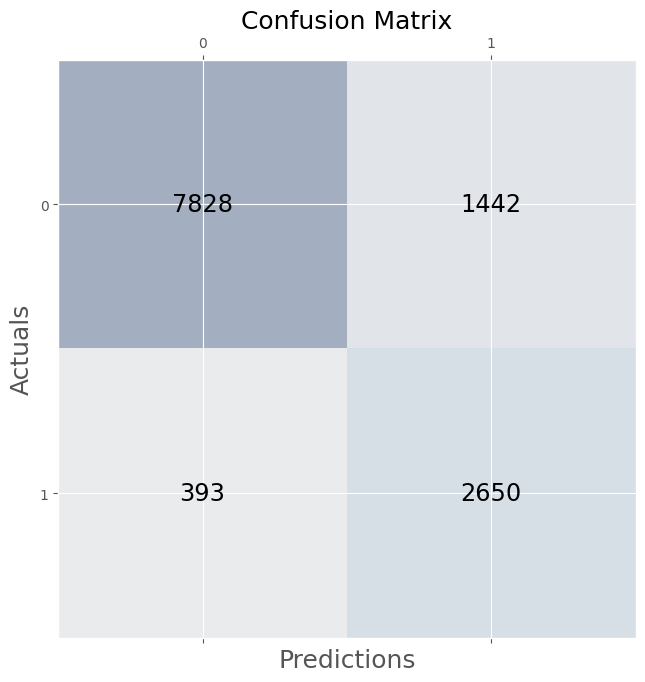



TrainingAccuracy: 0.8509705189636969
TrainingPrecision: 0.8576477890970169
TrainingRecall: 0.7999003398658491
TrainingF1-score: 0.8189530008365098


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[570  49]
 [160 148]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.78      0.92      0.85       619
         OFF       0.75      0.48      0.59       308

    accuracy                           0.77       927
   macro avg       0.77      0.70      0.72       927
weighted avg       0.77      0.77      0.76       927



------------------------- Displaying the confusion matrix for Validation


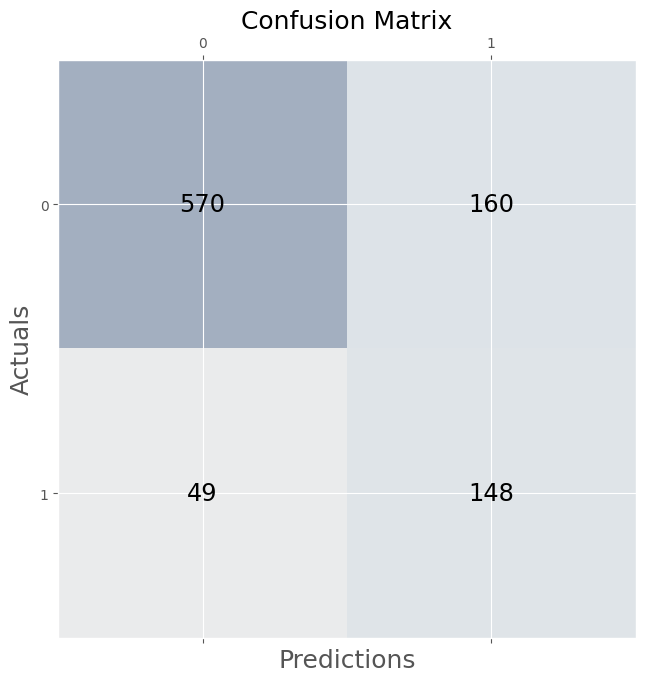

ValidationAccuracy: 0.7745415318230853
ValidationPrecision: 0.7660454766706071
ValidationRecall: 0.700679772569918
ValidationF1-score: 0.7156045181982986


In [ ]:
print('-----------------------------------Train using of 100% of data----------------------------------------------------------')

model_2_100_train_acc,model_2_100_train_prec,model_2_100_train_recall,model_2_100_train_f1,model_2_100_valid_acc,model_2_100_valid_prec,model_2_100_valid_recall,model_2_100_valid_f1 = train_method2(train_file,valid_file, MODEL_2_100_DIRECTORY)

---------------------------------------------------------Train using of 25% of data------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  61407  @USER @USER @USER @USER @USER Really? It's oka...   NOT
1  97595  @USER @USER @USER @USER @USER @USER @USER @USE...   NOT
2  81754  @USER @USER @USER Tippi Hedren was in Julie an...   NOT
3  25016  #PresidentMaduro Feasts with #SaltBae as #Vene...   NOT
4  85796  @USER YOUR TRASH!!!!!!!! But she would have be...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still

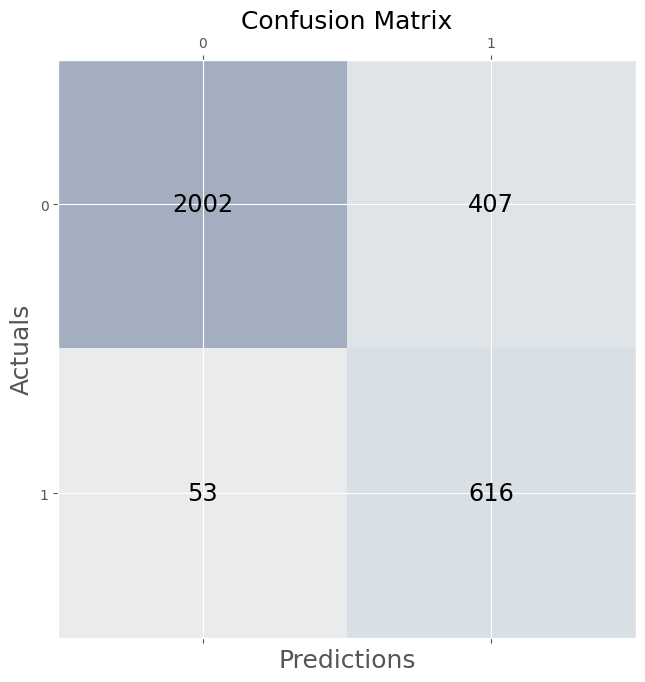



TrainingAccuracy: 0.8505523066926576
TrainingPrecision: 0.8759137539160882
TrainingRecall: 0.7881798916882505
TrainingF1-score: 0.8125428963623884


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[578  41]
 [190 118]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.75      0.93      0.83       619
         OFF       0.74      0.38      0.51       308

    accuracy                           0.75       927
   macro avg       0.75      0.66      0.67       927
weighted avg       0.75      0.75      0.72       927



------------------------- Displaying the confusion matrix for Validation


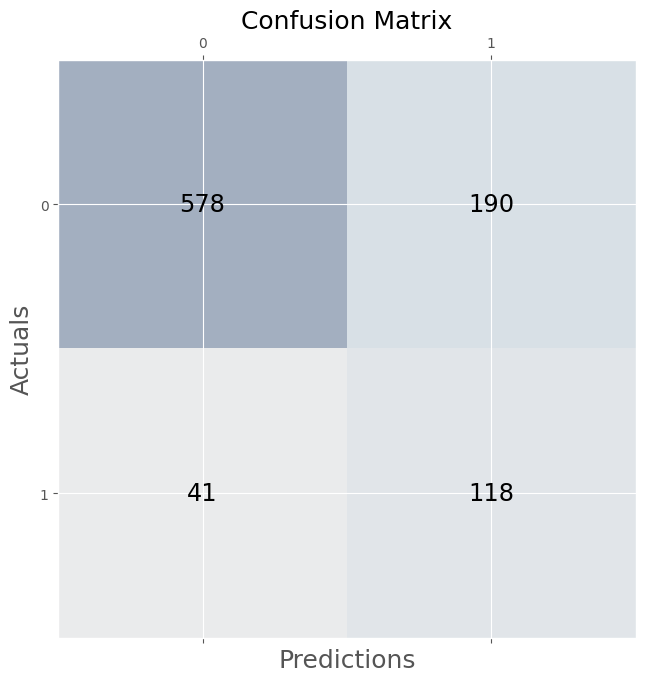

ValidationAccuracy: 0.7508090614886731
ValidationPrecision: 0.7473712657232704
ValidationRecall: 0.6584405094098148
ValidationF1-score: 0.6694034079067017


In [ ]:
# training the model on 25% of train data
print('---------------------------------------------------------Train using of 25% of data------------------------------------')


model_2_25_train_acc,model_2_25_train_prec,model_2_25_train_recall,model_2_25_train_f1,model_2_25_valid_acc,model_2_25_valid_prec,model_2_25_valid_recall,model_2_25_valid_f1 = train_method2(train_25_file,valid_file, MODEL_2_25_DIRECTORY)

---------------------------------------------------------Train using of 50% of data------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  61407  @USER @USER @USER @USER @USER Really? It's oka...   NOT
1  97595  @USER @USER @USER @USER @USER @USER @USER @USE...   NOT
2  81754  @USER @USER @USER Tippi Hedren was in Julie an...   NOT
3  25016  #PresidentMaduro Feasts with #SaltBae as #Vene...   NOT
4  85796  @USER YOUR TRASH!!!!!!!! But she would have be...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still

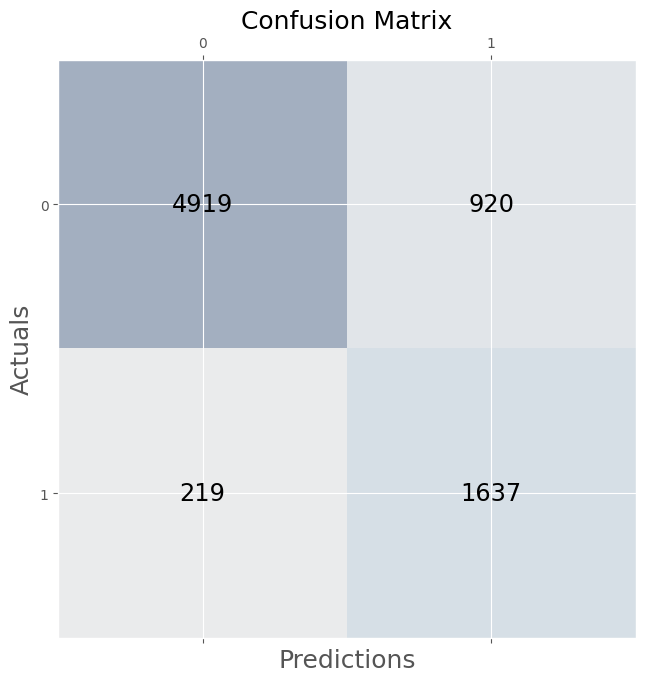



TrainingAccuracy: 0.8519818063677713
TrainingPrecision: 0.8622215420537291
TrainingRecall: 0.7987898871856358
TrainingF1-score: 0.8190682613241071


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[574  45]
 [168 140]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.77      0.93      0.84       619
         OFF       0.76      0.45      0.57       308

    accuracy                           0.77       927
   macro avg       0.77      0.69      0.71       927
weighted avg       0.77      0.77      0.75       927



------------------------- Displaying the confusion matrix for Validation


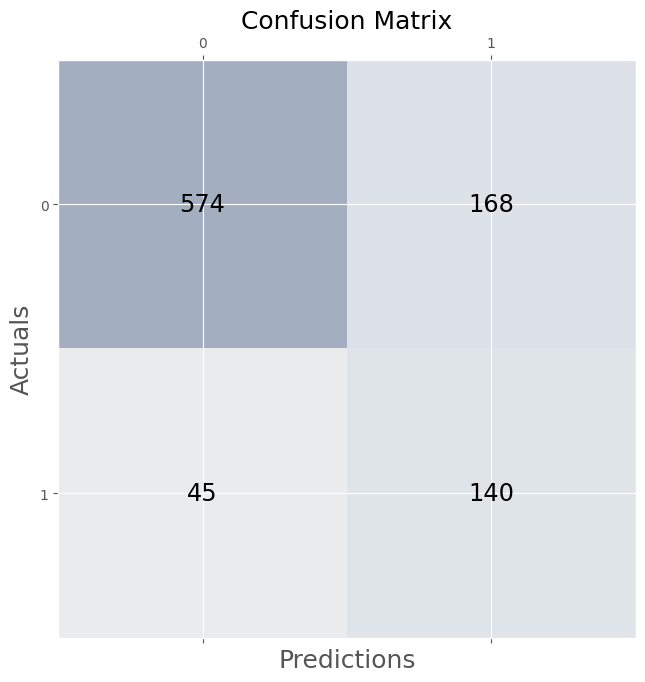

ValidationAccuracy: 0.7702265372168284
ValidationPrecision: 0.7651708312085671
ValidationRecall: 0.6909237773535027
ValidationF1-score: 0.7057243734099583


In [ ]:
# training the model on 50% of train data
print('---------------------------------------------------------Train using of 50% of data------------------------------------')
model_2_50_train_acc,model_2_50_train_prec,model_2_50_train_recall,model_2_50_train_f1,model_2_50_valid_acc,model_2_50_valid_prec,model_2_50_valid_recall,model_2_50_valid_f1 = train_method2(train_50_file,valid_file, MODEL_2_50_DIRECTORY)

---------------------------------------------------------Train using of 75% of data------------------------------------
-----------------------Displaying values from Training Dataset
      id                                              tweet label
0  61407  @USER @USER @USER @USER @USER Really? It's oka...   NOT
1  97595  @USER @USER @USER @USER @USER @USER @USER @USE...   NOT
2  81754  @USER @USER @USER Tippi Hedren was in Julie an...   NOT
3  25016  #PresidentMaduro Feasts with #SaltBae as #Vene...   NOT
4  85796  @USER YOUR TRASH!!!!!!!! But she would have be...   OFF
-----------------------Displaying values from Validation Dataset
      id                                              tweet label
0  12476  @USER @USER @USER Trump is declassifying infor...   NOT
1  23242  @USER Ha even with them trying to rig the syst...   NOT
2  97885  @USER @USER @USER Man you really thought this ...   NOT
3  43414  @USER Ms. Clinton - you are a class act. My re...   OFF
4  81403  @USER It’s still

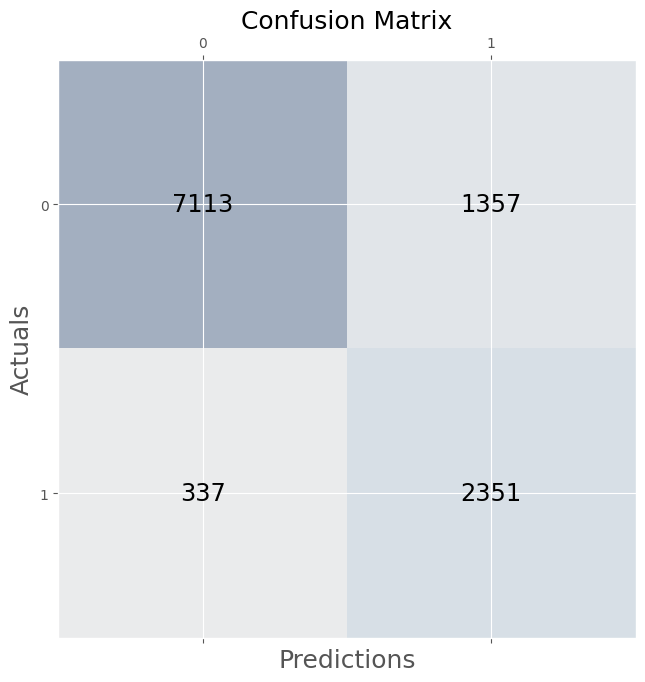



TrainingAccuracy: 0.848180677540778
TrainingPrecision: 0.8572077307162534
TrainingRecall: 0.7943998103139955
TrainingF1-score: 0.8143699658392023


------------------------- Displaing the computing performance for Validation


------------------------- Displaying the confusion matrix for Validation
[[573  46]
 [169 139]]


------------------------- Displaying the classification report for Validation
              precision    recall  f1-score   support

         NOT       0.77      0.93      0.84       619
         OFF       0.75      0.45      0.56       308

    accuracy                           0.77       927
   macro avg       0.76      0.69      0.70       927
weighted avg       0.77      0.77      0.75       927



------------------------- Displaying the confusion matrix for Validation


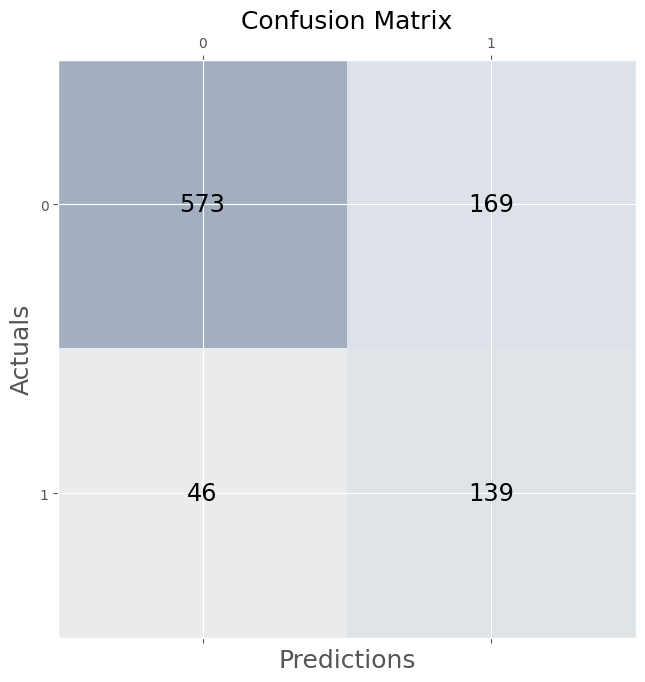

ValidationAccuracy: 0.7680690399137001
ValidationPrecision: 0.7617942740584249
ValidationRecall: 0.6884926462874766
ValidationF1-score: 0.7029612219865777


In [ ]:
# training the model on 75% of train data
print('---------------------------------------------------------Train using of 75% of data------------------------------------')


model_2_75_train_acc,model_2_75_train_prec,model_2_75_train_recall,model_2_75_train_f1,model_2_75_valid_acc,model_2_75_valid_prec,model_2_75_valid_recall,model_2_75_valid_f1 = train_method2(train_75_file,valid_file, MODEL_2_75_DIRECTORY)


In [ ]:
def test_method2(test_file, model_file, vectorizer_file, output_dir):
    """
     take test_file, model_file and output_dir as input.
     It loads model and test of the examples in the test_file.
     It prints different evaluation metrics, and saves the output in output directory

     ADD Other arguments, if needed

    Args:
        test_file: Test file name
        model_file: Model file name
        vectorizer_file: Vectorizer file name
        output_dir: Output Directory

    """

    test_df = read_data(test_file,'Testing Dataset')


    test_label = test_df['label']

    model, vectorizer = load_model1(model_file, vectorizer_file)

    test_values= prepare_dataset2(test_df,vectorizer)

    test_pred_label = model.predict(test_values)

    test_df['out_label']  = test_pred_label # Note how this is saved

    computing_performance(test_label,test_pred_label,model,'Training',confusion_matrix(test_pred_label,test_label))
    test_acc,test_prec,test_recall,test_f1=evaluate_model(test_label,test_pred_label,'Testing')

    out_file = os.path.join(output_dir, 'output_test.csv')

    print('Saving model output to', out_file)
    test_df.to_csv(out_file)
    return test_acc,test_prec,test_recall,test_f1


Testing using model trained on 100% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/100/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/100/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[596  24]
 [135 105]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.

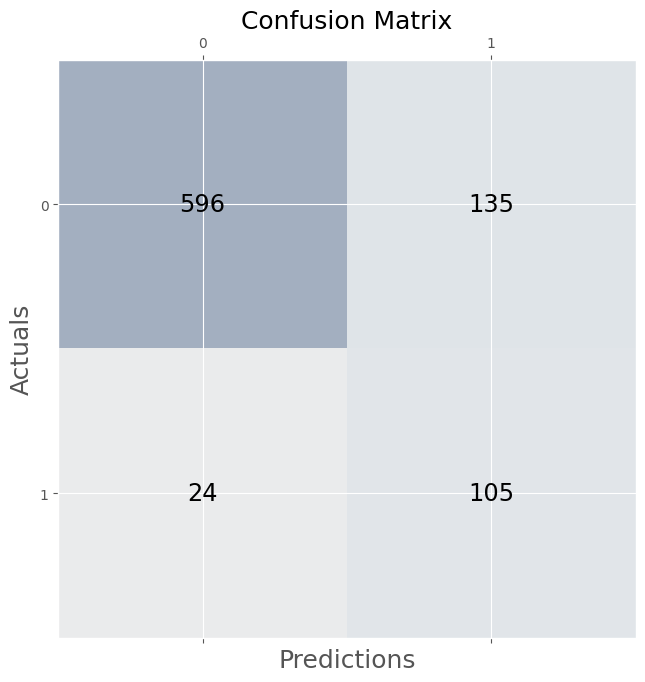

TestingAccuracy: 0.8151162790697675
TestingPrecision: 0.8146374829001368
TestingRecall: 0.6993951612903226
TestingF1-score: 0.7257075457505131
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/2/100/output_test.csv


In [ ]:
print('Testing using model trained on 100% data')

model_2_100_file = os.path.join(MODEL_2_100_DIRECTORY, 'model.sav')

vectorizer_2_100_file = os.path.join(MODEL_2_100_DIRECTORY,'vectorizer.sav')

model_2_100_test_acc,model_2_100_test_prec,model_2_100_test_recall,model_2_100_test_f1=test_method2(test_file, model_2_100_file, vectorizer_2_100_file, MODEL_2_100_DIRECTORY)

Testing using model trained on 25% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/25/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/25/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[593  27]
 [144  96]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.80 

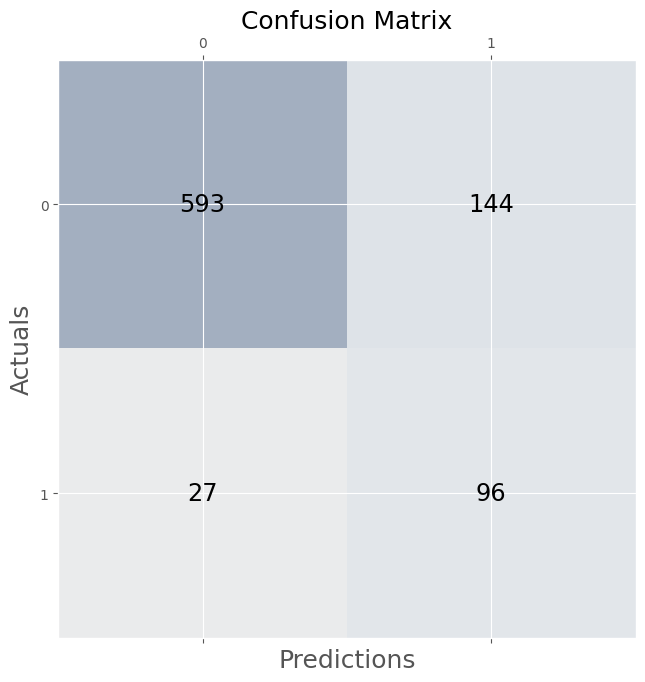

TestingAccuracy: 0.8011627906976744
TestingPrecision: 0.7925505510143297
TestingRecall: 0.6782258064516129
TestingF1-score: 0.7014561776402735
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/2/25/output_test.csv


In [ ]:
print('Testing using model trained on 25% data')

model_2_25_file = os.path.join(MODEL_2_25_DIRECTORY, 'model.sav')

vectorizer_2_25_file = os.path.join(MODEL_2_25_DIRECTORY,'vectorizer.sav')

model_2_25_test_acc,model_2_25_test_prec,model_2_25_test_recall,model_2_25_test_f1=test_method2(test_file, model_2_25_file, vectorizer_2_25_file, MODEL_2_25_DIRECTORY)

Testing using model trained on 50% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/50/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/50/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[595  25]
 [141  99]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.81 

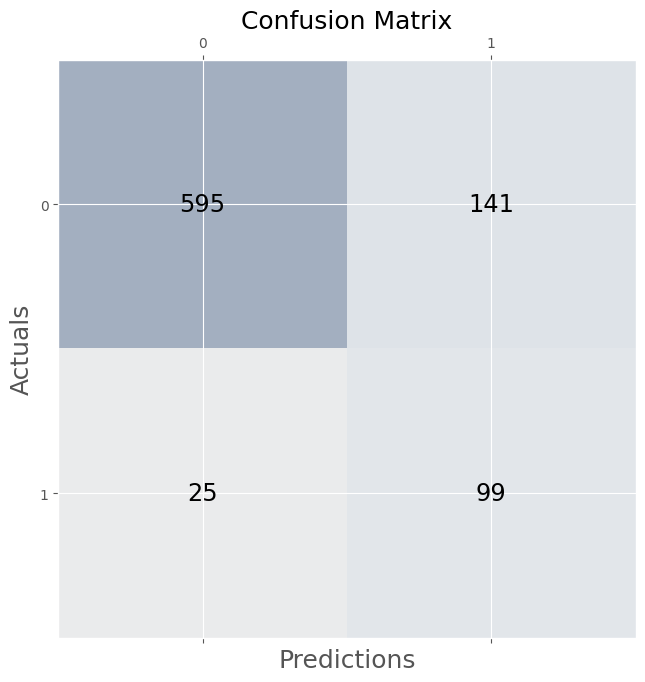

TestingAccuracy: 0.8069767441860465
TestingPrecision: 0.8034055049088359
TestingRecall: 0.6860887096774193
TestingF1-score: 0.7107685824499983
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/2/50/output_test.csv


In [ ]:
print('Testing using model trained on 50% data')

model_2_50_file = os.path.join(MODEL_2_50_DIRECTORY, 'model.sav')

vectorizer_2_50_file = os.path.join(MODEL_2_50_DIRECTORY,'vectorizer.sav')

model_2_50_test_acc,model_2_50_test_prec,model_2_50_test_recall,model_2_50_test_f1=test_method2(test_file, model_2_50_file, vectorizer_2_50_file, MODEL_2_50_DIRECTORY)

Testing using model trained on 75% data
-----------------------Displaying values from Testing Dataset
      id                                              tweet label
0  15923  #WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...   OFF
1  27014  #ConstitutionDay is revered by Conservatives, ...   NOT
2  30530  #FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...   NOT
3  13876  #Watching #Boomer getting the news that she is...   NOT
4  60133  #NoPasaran: Unity demo to oppose the far-right...   OFF
Loaded model from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/75/model.sav
Loaded Vectorizer from  gdrive/MyDrive/CE807/Assignment2/2202326/models/2/75/vectorizer.sav
------------------------- Displaing the computing performance for Training


------------------------- Displaying the confusion matrix for Training
[[600  20]
 [134 106]]


------------------------- Displaying the classification report for Training
              precision    recall  f1-score   support

         NOT       0.82 

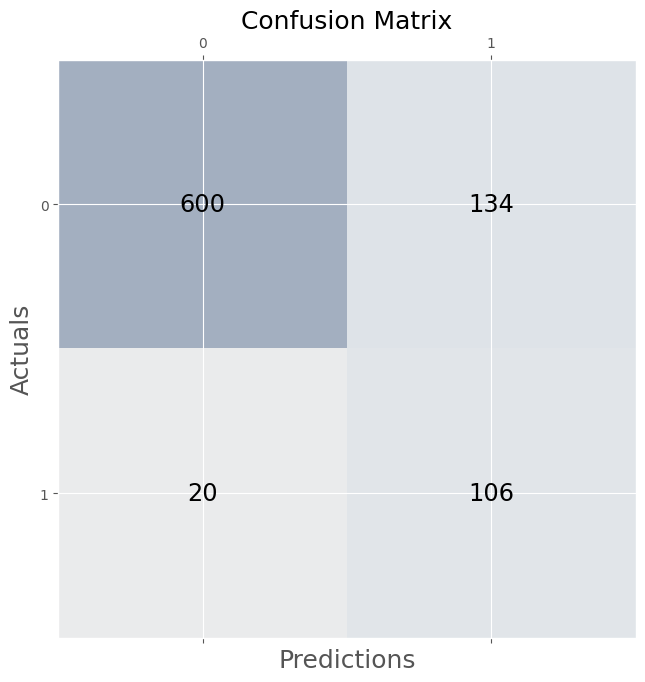

TestingAccuracy: 0.8209302325581396
TestingPrecision: 0.829354266683967
TestingRecall: 0.7047043010752688
TestingF1-score: 0.7327489486726235
Saving model output to gdrive/MyDrive/CE807/Assignment2/2202326/models/2/75/output_test.csv


In [ ]:
print('Testing using model trained on 75% data')

model_2_75_file = os.path.join(MODEL_2_75_DIRECTORY, 'model.sav')

vectorizer_2_75_file = os.path.join(MODEL_2_75_DIRECTORY,'vectorizer.sav')

model_2_75_test_acc,model_2_75_test_prec,model_2_75_test_recall,model_2_75_test_f1=test_method2(test_file, model_2_75_file, vectorizer_2_75_file, MODEL_2_75_DIRECTORY)

## Generating Graphs

In [ ]:
import matplotlib.pyplot as plt




# setting up variables for model 1
########################## plotting for precision
training_precision = [model_25_train_prec,model_50_train_prec,model_75_train_prec,model_100_train_prec]
validation_precision = [model_25_valid_prec,model_50_valid_prec,model_75_valid_prec,model_100_valid_prec]
testing_precision = [model_1_25_test_prec,model_1_50_test_prec,model_1_75_test_prec,model_1_100_test_prec]
########################## plotting for Accuracy
training_accuracy = [model_25_train_acc,model_50_train_acc,model_75_train_acc,model_100_train_acc]
validation_accuracy = [model_25_valid_acc,model_50_valid_acc,model_75_valid_acc,model_100_valid_acc]
testing_accuracy = [model_1_25_test_acc,model_1_50_test_acc,model_1_75_test_acc,model_1_100_test_acc]
########################## plotting for Recall
training_recall = [model_25_train_recall,model_50_train_recall,model_75_train_recall,model_100_train_recall]
validation_recall = [model_25_valid_recall,model_50_valid_recall,model_75_valid_recall,model_100_valid_recall]
testing_recall = [model_1_25_test_recall,model_1_50_test_recall,model_1_75_test_recall,model_1_100_test_recall]
########################## plotting for f1
training_f1 = [model_25_train_f1,model_50_train_f1,model_75_train_f1,model_100_train_f1]
validation_f1 = [model_25_valid_f1,model_50_valid_f1,model_75_valid_f1,model_100_valid_f1]
testing_f1 = [model_1_25_test_f1,model_1_50_test_f1,model_1_75_test_f1,model_1_100_test_f1]
#############################

## setting up variables for model 2
########################## plotting for precision
training2_precision = [model_2_25_train_prec,model_2_50_train_prec,model_2_75_train_prec,model_2_100_train_prec]
validation2_precision = [model_2_25_valid_prec,model_2_50_valid_prec,model_2_75_valid_prec,model_2_100_valid_prec]
testing2_precision = [model_2_25_test_prec,model_2_50_test_prec,model_2_75_test_prec,model_2_100_test_prec]
########################## plotting for Accuracy
training2_accuracy = [model_2_25_train_acc,model_2_50_train_acc,model_2_75_train_acc,model_2_100_train_acc]
validation2_accuracy = [model_2_25_valid_acc,model_2_50_valid_acc,model_2_75_valid_acc,model_2_100_valid_acc]
testing2_accuracy = [model_2_25_test_acc,model_2_50_test_acc,model_2_75_test_acc,model_2_100_test_acc]
########################## plotting for Recall
training2_recall = [model_2_25_train_recall,model_2_50_train_recall,model_2_75_train_recall,model_2_100_train_recall]
validation2_recall = [model_2_25_valid_recall,model_2_50_valid_recall,model_2_75_valid_recall,model_2_100_valid_recall]
testing2_recall = [model_2_25_test_recall,model_2_50_test_recall,model_2_75_test_recall,model_2_100_test_recall]
########################## plotting for f1
training2_f1 = [model_2_25_train_f1,model_2_50_train_f1,model_2_75_train_f1,model_2_100_train_f1]
validation2_f1 = [model_2_25_valid_f1,model_2_50_valid_f1,model_2_75_valid_f1,model_2_100_valid_f1]
testing2_f1 = [model_2_25_test_f1,model_2_50_test_f1,model_2_75_test_f1,model_2_100_test_f1]



def plotting_graph(valid,test,Model,typ):
  # Performance metrics for different data sizes for model 1
  data_sizes = [25, 50, 75, 100]  # X-axis

   # Plotting training set performance
  # plt.plot(data_sizes, train, label='Training Set')
  # Plotting validation set performance
  plt.plot(data_sizes, valid, label='Validation Set')
  # Plotting testing set performance
  plt.plot(data_sizes, test, label='Testing Set')

  # Adding labels and title
  plt.xlabel('Data Size (%)')
  plt.ylabel('Performance Measure of  '+typ)
  plt.title(typ+' vs Data Size for '+Model)

  # Adding legend
  plt.legend()

  # Displaying the plot
  plt.show()

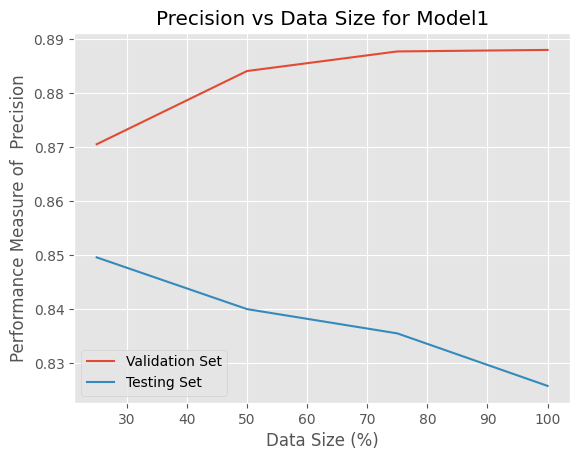

In [ ]:
# plotting graph for precision model1
plotting_graph(validation_precision,testing_precision,'Model1','Precision')

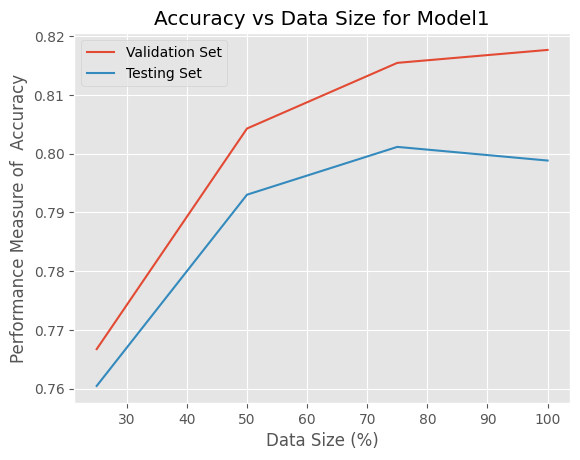

In [ ]:
# plotting graph for accuracy model1
plotting_graph(validation_accuracy,testing_accuracy,'Model1','Accuracy')

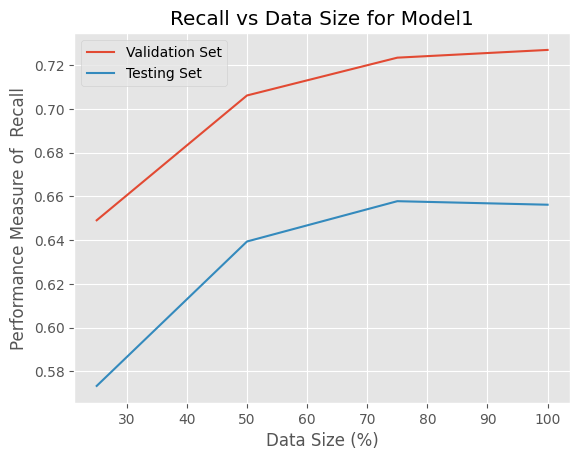

In [ ]:
# plotting graph for recall model 1
plotting_graph(validation_recall,testing_recall,'Model1','Recall')

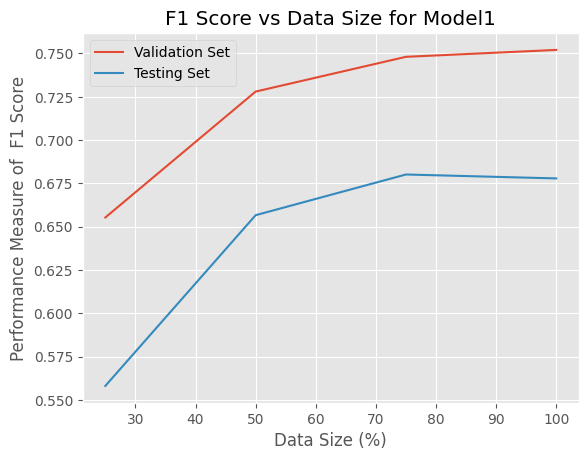

In [ ]:
#plotting F1 graph model1
plotting_graph(validation_f1,testing_f1,'Model1','F1 Score')

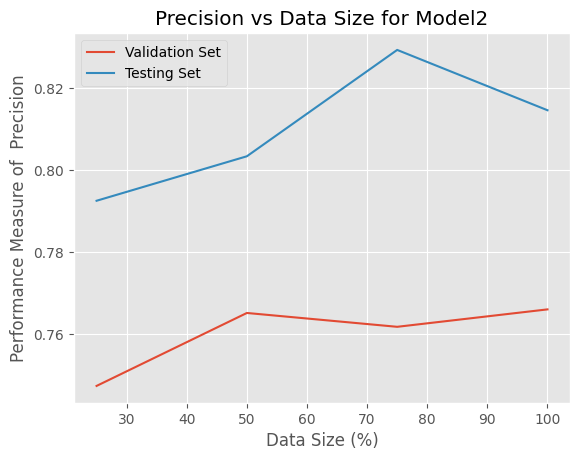

In [ ]:
# plotting graph for precision for model 2
plotting_graph(validation2_precision,testing2_precision,'Model2','Precision')

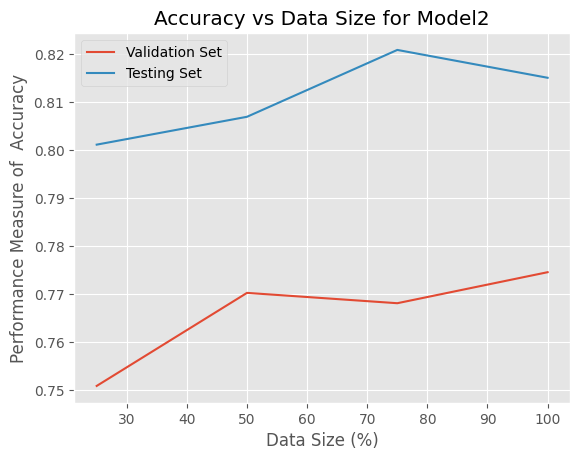

In [ ]:
# plotting graph for accuracy for model 2
plotting_graph(validation2_accuracy,testing2_accuracy,'Model2','Accuracy')

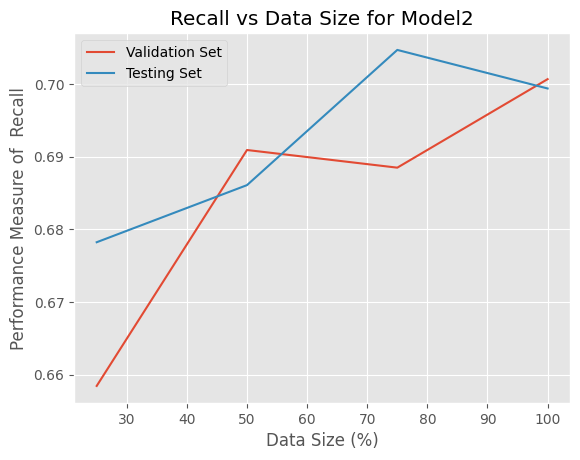

In [ ]:
# plotting graph for recall Model 2
plotting_graph(validation2_recall,testing2_recall,'Model2','Recall')

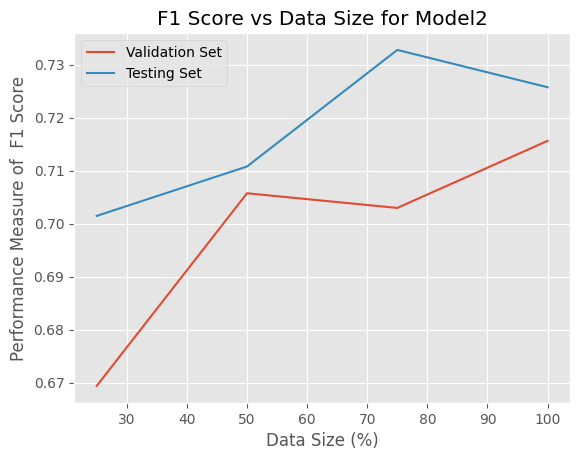

In [ ]:
#plotting F1 graph for model 2
plotting_graph(validation2_f1,testing2_f1,'Model2','F1 Score')